## Part 1

In this part we will take the raw images, change their perspective and crop the rest 

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def output_grid(image_name):
        
    image = cv2.imread(image_name)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    original_image = image.copy()
    my_image = image.copy()
    
    # Blur the image
    image = cv2.GaussianBlur(image, (11, 11), 0)

    # Apply Adaptive Threshold
    image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 17, 2)
    
    # Invert the images
    image = cv2.bitwise_not(image)
    
    # Define a kernel (little reference and trial and error)
    kernel = np.ones((3, 3), np.uint8)

    # Dilate the images (i.e make the figures more thicker)
    image = cv2.dilate(image, kernel)
    
    # Find the contours in the image
    contours, _ = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Find largest contour area in the image

    maximum_area = 0
    contour_index = 0

    contour_thickness = 2
    contour_colour = (255, 0, 0)

    for contour in contours:

        area = cv2.contourArea(contour)
    
        # Check if area is above a particular value (lets assume 1000 here)
        if area > 1000:
        
            if area > maximum_area:
            
                maximum_area = area
                largest_contour = contour
            
                # Draw the contours on the image
                new_image = cv2.drawContours(image, contours, contour_index, contour_colour, contour_thickness)
            
        contour_index += 1
    
    my_corners = cv2.boundingRect(largest_contour)
    
    # Create a mask with all the largest part as white and rest part as black
    mask = np.zeros((image.shape),np.uint8)

    contour_thickness = -1
    contour_colour = (255, 255, 255)
    mask_image = cv2.drawContours(mask, [largest_contour], 0, contour_colour, contour_thickness)

    contour_thickness = 2
    contour_colour = (0, 0, 0)
    mask_image = cv2.drawContours(mask, [largest_contour], 0, contour_colour, contour_thickness)
    
    # Find corners on the mask
    old_corners = cv2.goodFeaturesToTrack(mask_image, 27, 0.01, 10) 
    
    # Remove additional corner points detected
    
    min_x = old_corners[0][0][0]
    min_y = old_corners[0][0][1]
    max_x = old_corners[0][0][0]
    max_y = old_corners[0][0][1]
    
    my_corners = []
    
    for corner in old_corners:
        for inner_corner in corner:
            x, y = inner_corner
            if x < min_x:
                min_x = x
            if y < min_y:
                min_y = y
            if x > max_x:
                max_x = x
            if y > max_y:
                max_y = y
            
    # Iterate over corner points detected and store them in new array after filtering some out
    for corner in old_corners:
        for inner_corner in corner:
            
            x, y = inner_corner
            
            if -25 < x-min_x < 25 or -25 < x-max_x < 25 or -25 < y-min_y < 25 or -25 < y-max_y < 25:     
                    my_corners.append([x, y])
    
    my_corners = np.array(my_corners)
    
    # After filtering out some corner points, finally filter out any other remaining corner points and keep only 4 points
    corners = np.zeros((4, 2), dtype = "float32")
    
    s = my_corners.sum(axis = 1)
    corners[0] = my_corners[np.argmin(s)]
    corners[2] = my_corners[np.argmax(s)]
    
    diff = np.diff(my_corners, axis = 1)
    corners[1] = my_corners[np.argmin(diff)]
    corners[3] = my_corners[np.argmax(diff)]
    
    # Iterate over corner points and draw them on the image
    for corner in corners: 
        x, y = corner.ravel() 
        new_image = cv2.circle(my_image, (int(x), int(y)), 3, (255, 0, 0), 3) 
        
    # Use the current mask and mask it in the original image
    new_image = np.zeros_like(original_image)
    new_image[mask_image == 255] = original_image[mask_image == 255]
    
    # Blur the image
    image = cv2.GaussianBlur(new_image, (5, 5), 0)

    # Apply Adaptive Threshold 
    image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C * cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 5)    
    # Invert the images
    image = cv2.bitwise_not(image)
    
    # Define a kernel (little reference along with trial and error)
    kernel = np.ones((2, 2), np.uint8)
    # Erode the image (make the white spots smaller)
    image = cv2.erode(image, kernel)

    # Define a kernel (little reference along with trial and error)
    kernel = np.ones((2, 2), np.uint8)
    # Dilate the image (make the white spots thicker)
    image = cv2.dilate(image, kernel)
    
    # Calculation of new points (Math is available here: https://www.pyimagesearch.com/2014/08/25/4-point-opencv-getperspective-transform-example/)
    (x1, y1, x2, y2) = corners

    width1 = np.sqrt(((x2[0] - y2[0]) ** 2) + ((x2[1] - y2[1]) ** 2))
    width2 = np.sqrt(((y1[0] - x1[0]) ** 2) + ((y1[1] - x1[1]) ** 2))

    height1 = np.sqrt(((y1[0] - x2[0]) ** 2) + ((y1[1] - x2[1]) ** 2))
    height2 = np.sqrt(((x1[0] - y2[0]) ** 2) + ((x1[1] - y2[1]) ** 2))

    maxWidth = max(int(width1), int(width2))
    maxHeight = max(int(height1), int(height2))

    # Check if height and width are equal or not and make them equal so that the grid is a square

    if maxWidth < maxHeight:
        maxWidth = maxHeight
    else:
        maxHeight = maxWidth

    # Finally declaring new points with 0,0 a,0 a,a 0,a format
    new_corners = np.array([[0, 0], [maxWidth - 1, 0], [maxWidth - 1, maxHeight - 1], [0, maxHeight - 1]], dtype = "float32")

    # Get matrix for perspective transformation
    matrix = cv2.getPerspectiveTransform(corners, new_corners)

    # Finally, warp the image with the matrix
    warped_image = cv2.warpPerspective(image, matrix, (maxWidth, maxHeight))
        
    return my_image, warped_image, mask_image

In [2]:
from pathlib import Path
import os

warped_images = []
original_images = []
masked_images = []

try:
    os.mkdir('Output')
except:
    pass

for i in range (1, 1000):
    
    image_name = "image" + str(i) + ".jpg"
    image_path = "Training/" + image_name
    my_file = Path(image_path)
    
    if my_file.exists():
        
        original_image, warped_image, masked_image = output_grid(image_path)
        
        image_path = "Output/" + image_name
        
        cv2.imwrite(image_path, warped_image)
        
        masked_images.append(masked_image)
        original_images.append(original_image)
        warped_images.append(warped_image)

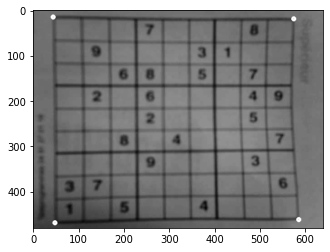

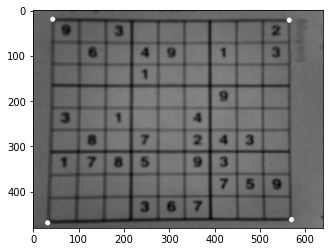

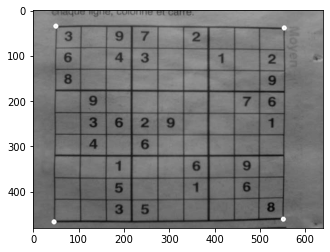

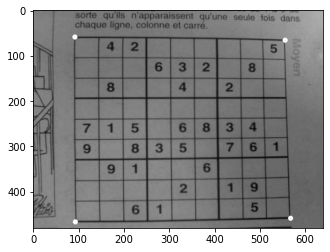

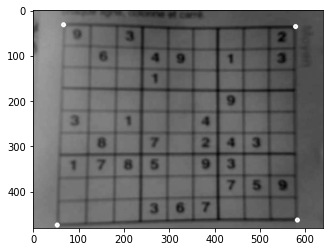

...

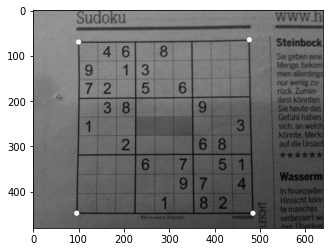

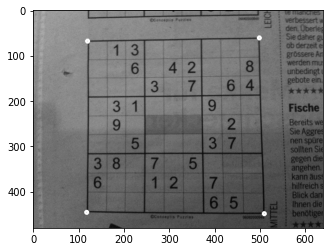

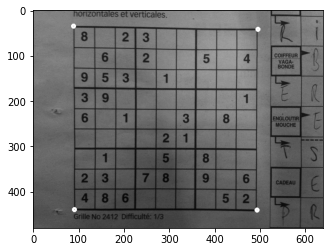

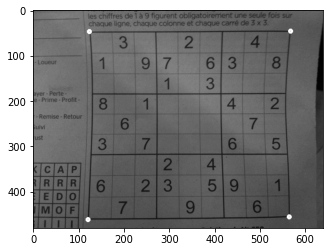

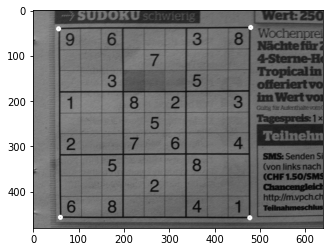

In [3]:
for original_image in original_images:
    
    plt.imshow(original_image, 'gray')
    plt.show()

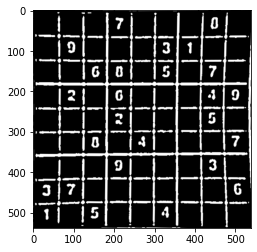

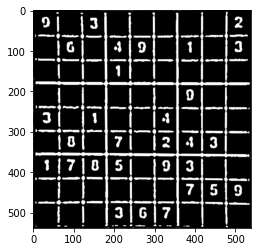

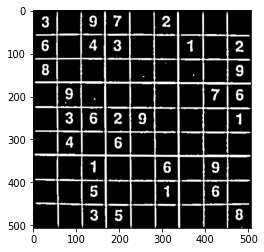

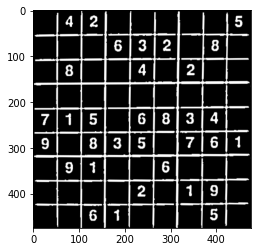

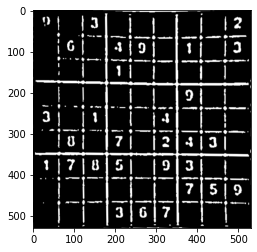

...

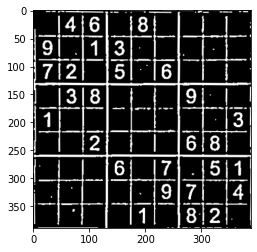

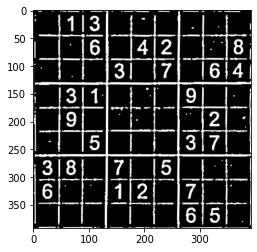

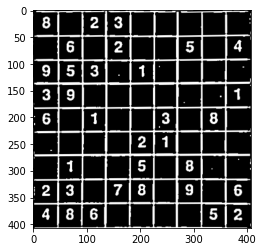

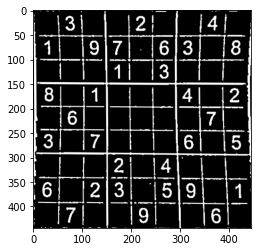

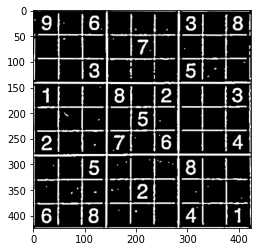

In [4]:
for warped_image in warped_images:
    
    plt.imshow(warped_image, 'gray')
    plt.show()

#### Part 1 Complete

<hr>

## Part 2
In this part we wil work on extracting the numbers from the warped images

In [1]:
# Keras Kernel Injection
# This code is only for supporting Keras Library which has compatibility issues with newer Tensorflow library

import tensorflow as tf
import keras.backend.tensorflow_backend as tfback

print("tf.__version__ is", tf.__version__)
print("tf.keras.__version__ is:", tf.keras.__version__)

def _get_available_gpus():
    """Get a list of available gpu devices (formatted as strings).

    # Returns
        A list of available GPU devices.
    """
    #global _LOCAL_DEVICES
    if tfback._LOCAL_DEVICES is None:
        devices = tf.config.list_logical_devices()
        tfback._LOCAL_DEVICES = [x.name for x in devices]
    return [x for x in tfback._LOCAL_DEVICES if 'device:gpu' in x.lower()]

tfback._get_available_gpus = _get_available_gpus

Using TensorFlow backend.


tf.__version__ is 2.2.0
tf.keras.__version__ is: 2.3.0-tf


In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from keras.models import model_from_json

# Load the saved model
json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
                               
# load weights into new model
loaded_model.load_weights("model.h5")
print("Loaded saved model from disk.")
 
# evaluate loaded model on test data

Loaded saved model from disk.


In [3]:
def identify_number(image):
    
    image_resize = cv2.resize(image, (28,28))    
    image_resize_2 = image_resize.reshape(1,1,28,28)    
    
    loaded_model_pred = loaded_model.predict_classes(image_resize_2 , verbose = 0)
    return loaded_model_pred[0]

def extract_number(sudoku):
    sudoku = cv2.resize(sudoku, (450, 450))

    # split sudoku
    grid = np.zeros([9,9])
    for i in range(9):
        for j in range(9):
            
            image = sudoku[(i*50)+6:((i+1)*50)-6,(j*50)+6:((j+1)*50)-6]
            
            if image.sum() > 25000:
                grid[i][j] = identify_number(image)
    return grid

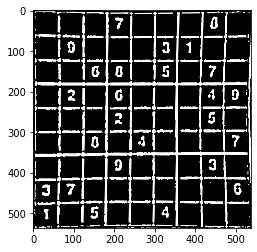

[[0. 0. 0. 7. 0. 0. 0. 0. 0.]
 [0. 0. 7. 0. 5. 5. 8. 0. 0.]
 [0. 0. 0. 0. 0. 5. 0. 8. 0.]
 [0. 2. 0. 0. 0. 0. 0. 4. 4.]
 [0. 0. 0. 2. 0. 0. 0. 5. 0.]
 [0. 0. 4. 0. 4. 0. 0. 0. 4.]
 [0. 0. 0. 4. 0. 0. 0. 4. 0.]
 [2. 3. 0. 0. 0. 0. 0. 0. 4.]
 [7. 0. 4. 0. 0. 4. 0. 0. 0.]] 



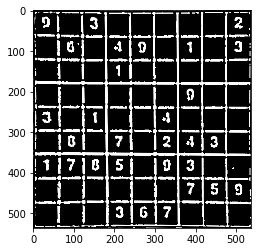

[[0. 0. 5. 0. 0. 0. 0. 0. 2.]
 [0. 0. 0. 4. 0. 0. 1. 0. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 4. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [7. 7. 4. 5. 0. 4. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 3. 5. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



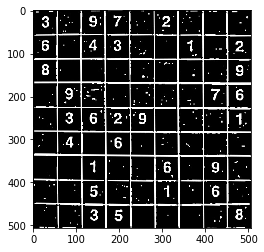

[[3. 0. 9. 7. 0. 2. 0. 0. 0.]
 [5. 0. 4. 3. 0. 0. 1. 0. 2.]
 [8. 0. 0. 0. 0. 0. 0. 0. 9.]
 [0. 9. 5. 0. 0. 0. 0. 7. 6.]
 [0. 3. 5. 2. 9. 0. 0. 0. 7.]
 [0. 4. 0. 5. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 6. 0. 9. 0.]
 [0. 0. 5. 0. 0. 7. 0. 6. 0.]
 [0. 0. 3. 5. 0. 0. 0. 0. 3.]] 



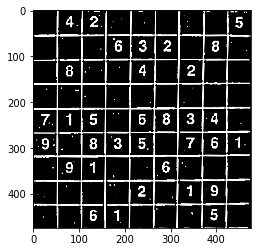

[[0. 4. 2. 0. 0. 0. 0. 0. 5.]
 [0. 0. 0. 6. 3. 2. 0. 8. 0.]
 [0. 8. 0. 0. 4. 0. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [7. 1. 5. 0. 5. 8. 3. 4. 0.]
 [9. 0. 8. 3. 5. 0. 3. 5. 1.]
 [0. 9. 1. 0. 0. 5. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 1. 9. 0.]
 [0. 0. 5. 1. 0. 0. 0. 5. 0.]] 



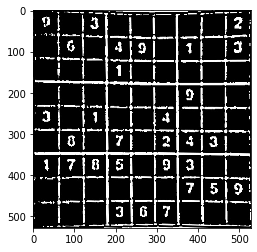

[[0. 0. 5. 0. 0. 0. 0. 0. 2.]
 [0. 6. 0. 4. 5. 5. 8. 0. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 7. 0. 0.]
 [2. 0. 4. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [7. 1. 4. 4. 0. 4. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 5. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



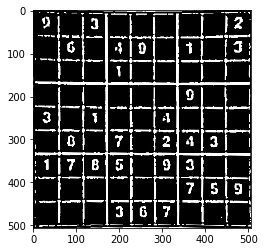

[[0. 0. 5. 0. 0. 0. 0. 0. 2.]
 [0. 6. 5. 4. 5. 5. 1. 0. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 7. 0. 0.]
 [2. 0. 7. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [7. 1. 4. 4. 0. 4. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 5. 5. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



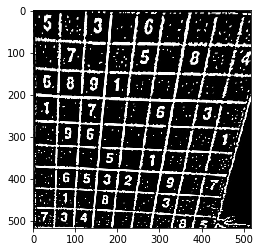

[[5. 3. 4. 6. 7. 6. 6. 1. 7.]
 [3. 5. 3. 5. 7. 7. 7. 4. 4.]
 [7. 4. 4. 2. 5. 2. 5. 1. 1.]
 [5. 5. 1. 5. 1. 1. 1. 1. 5.]
 [5. 1. 1. 1. 5. 7. 7. 4. 4.]
 [2. 1. 1. 2. 1. 1. 1. 4. 4.]
 [7. 4. 4. 4. 1. 6. 1. 5. 6.]
 [5. 7. 7. 4. 6. 5. 1. 1. 0.]
 [7. 2. 1. 5. 5. 7. 4. 4. 0.]] 



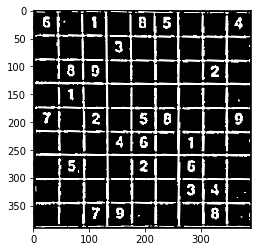

[[6. 0. 1. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 3. 0. 0. 0. 0. 0.]
 [0. 8. 0. 0. 0. 0. 0. 2. 0.]
 [0. 2. 0. 0. 0. 0. 0. 0. 0.]
 [7. 0. 2. 0. 5. 8. 0. 0. 9.]
 [0. 0. 0. 4. 6. 0. 1. 0. 0.]
 [0. 6. 0. 0. 2. 0. 6. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 7. 2. 0. 0. 0. 4. 0.]] 



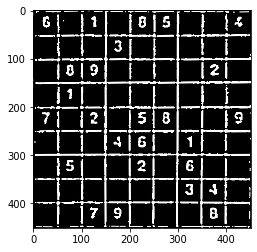

[[5. 0. 1. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 3. 0. 0. 0. 0. 0.]
 [0. 0. 9. 0. 0. 0. 0. 2. 0.]
 [0. 7. 0. 0. 0. 0. 0. 0. 0.]
 [7. 0. 2. 0. 5. 4. 0. 0. 9.]
 [0. 0. 0. 4. 5. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 5. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 3. 4. 0. 0. 0. 4. 0.]] 



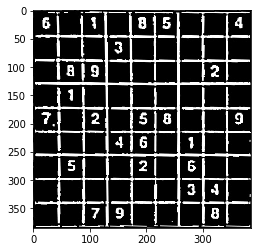

[[6. 0. 1. 0. 8. 5. 0. 0. 4.]
 [0. 0. 0. 3. 0. 0. 0. 0. 0.]
 [0. 8. 9. 0. 0. 0. 0. 2. 0.]
 [0. 7. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 2. 0. 5. 8. 0. 0. 9.]
 [0. 0. 0. 4. 6. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 6. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 7. 2. 0. 0. 0. 4. 0.]] 



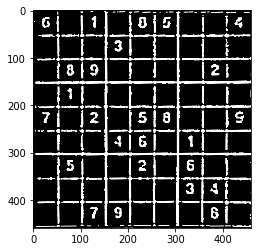

[[6. 0. 1. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 3. 0. 0. 0. 0. 0.]
 [0. 8. 9. 0. 0. 0. 0. 2. 0.]
 [0. 7. 0. 0. 0. 0. 0. 0. 0.]
 [3. 0. 2. 0. 5. 4. 0. 0. 5.]
 [0. 0. 0. 4. 5. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 5. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 4. 0.]
 [0. 0. 4. 4. 0. 0. 0. 4. 0.]] 



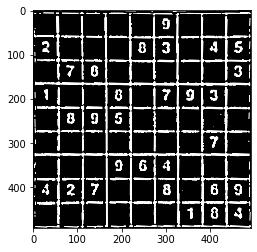

[[0. 0. 0. 0. 5. 5. 5. 0. 0.]
 [2. 0. 0. 0. 8. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [1. 0. 0. 0. 0. 3. 9. 3. 0.]
 [0. 4. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 7. 0.]
 [0. 0. 0. 2. 6. 4. 0. 0. 0.]
 [4. 2. 3. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]] 



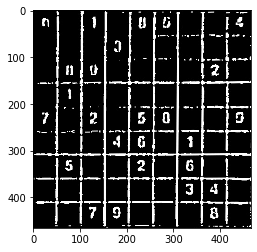

[[4. 0. 1. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 2. 0. 0. 0. 0. 0.]
 [0. 4. 4. 0. 0. 0. 0. 2. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [3. 0. 2. 0. 5. 4. 0. 0. 2.]
 [0. 0. 0. 4. 4. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 5. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 4. 4. 0. 0. 0. 4. 0.]] 



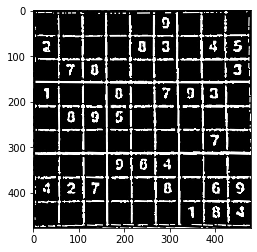

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [2. 0. 0. 4. 0. 3. 4. 2. 0.]
 [0. 4. 2. 6. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 4. 4. 7. 0. 0. 0.]
 [7. 4. 4. 0. 0. 4. 0. 4. 2.]
 [0. 0. 0. 0. 0. 0. 4. 4. 7.]] 



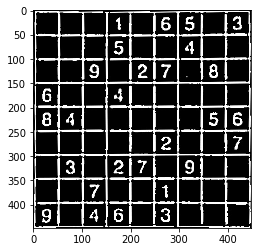

[[0. 0. 0. 9. 0. 8. 5. 0. 3.]
 [0. 0. 0. 5. 0. 0. 4. 0. 0.]
 [0. 0. 9. 0. 2. 7. 0. 8. 0.]
 [6. 0. 0. 4. 0. 0. 0. 0. 0.]
 [8. 4. 0. 0. 0. 0. 0. 5. 5.]
 [0. 0. 0. 0. 0. 2. 0. 0. 7.]
 [0. 3. 0. 2. 7. 0. 9. 0. 0.]
 [0. 0. 7. 0. 0. 1. 0. 0. 0.]
 [8. 0. 4. 6. 0. 3. 0. 0. 0.]] 



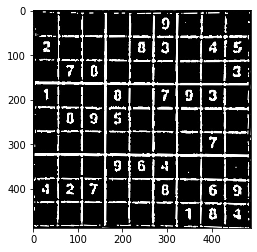

[[0. 0. 0. 0. 0. 9. 0. 0. 0.]
 [2. 0. 0. 0. 8. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [1. 0. 0. 0. 0. 7. 9. 3. 0.]
 [0. 4. 7. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 7. 0.]
 [0. 0. 0. 2. 5. 4. 0. 0. 0.]
 [4. 2. 3. 0. 0. 4. 0. 9. 7.]
 [0. 0. 0. 0. 0. 0. 4. 4. 4.]] 



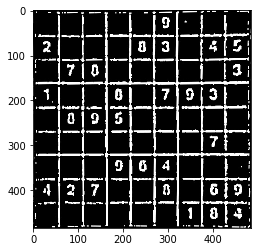

[[0. 0. 0. 0. 0. 9. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 3. 0. 0. 0. 0. 0. 0. 3.]
 [7. 0. 0. 0. 0. 3. 4. 3. 0.]
 [0. 4. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 2. 3. 0. 0. 4. 0. 4. 7.]
 [0. 0. 0. 0. 0. 0. 1. 4. 4.]] 



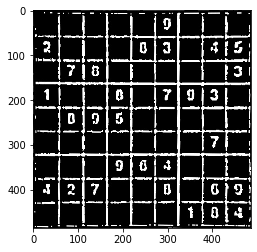

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 8. 7. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [2. 0. 0. 0. 0. 3. 0. 3. 0.]
 [0. 0. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 2. 3. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 4. 4. 4.]] 



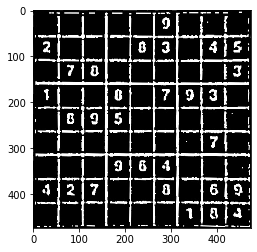

[[0. 0. 0. 0. 0. 9. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [1. 0. 0. 0. 0. 3. 7. 3. 0.]
 [0. 8. 9. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 2. 6. 4. 0. 0. 0.]
 [4. 2. 3. 0. 0. 4. 0. 5. 7.]
 [0. 0. 0. 0. 0. 0. 1. 4. 4.]] 



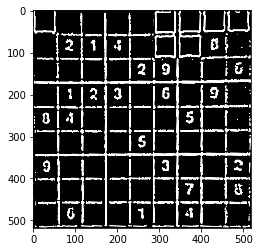

[[5. 0. 0. 0. 0. 4. 0. 1. 5.]
 [0. 2. 1. 4. 0. 0. 5. 4. 0.]
 [0. 0. 0. 0. 2. 4. 0. 0. 4.]
 [0. 1. 2. 2. 0. 6. 0. 4. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 3. 0. 4. 0. 0.]] 



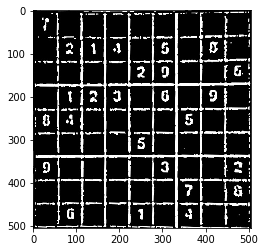

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 4. 5. 5. 5. 0. 8. 0.]
 [0. 5. 5. 5. 2. 7. 0. 0. 8.]
 [0. 9. 2. 3. 0. 8. 0. 9. 0.]
 [0. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 3. 0. 0. 3.]
 [0. 0. 0. 0. 0. 0. 7. 0. 5.]
 [0. 4. 0. 0. 1. 0. 4. 0. 0.]] 



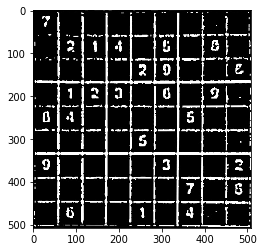

[[3. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 1. 4. 0. 5. 0. 0. 0.]
 [0. 0. 0. 0. 2. 4. 0. 0. 5.]
 [0. 7. 2. 2. 0. 4. 0. 7. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 4. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 4. 0. 4.]
 [0. 4. 0. 0. 4. 0. 4. 0. 0.]] 



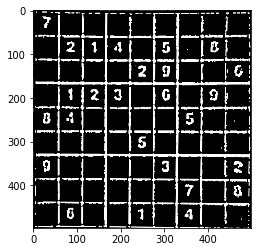

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 9. 4. 0. 5. 0. 8. 0.]
 [0. 0. 0. 0. 2. 7. 0. 0. 5.]
 [0. 1. 2. 2. 0. 0. 0. 9. 0.]
 [0. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 3.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 3. 0. 4. 0. 0.]] 



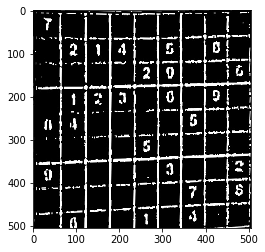

[[7. 5. 5. 5. 2. 5. 6. 0. 0.]
 [0. 7. 7. 5. 5. 5. 7. 0. 0.]
 [0. 5. 5. 5. 7. 7. 5. 7. 5.]
 [5. 9. 5. 5. 5. 4. 7. 9. 0.]
 [4. 5. 5. 5. 5. 5. 6. 0. 0.]
 [0. 5. 5. 5. 4. 6. 6. 0. 0.]
 [3. 5. 5. 5. 5. 7. 6. 0. 2.]
 [0. 5. 5. 5. 5. 7. 7. 0. 9.]
 [7. 5. 5. 5. 7. 7. 4. 0. 0.]] 



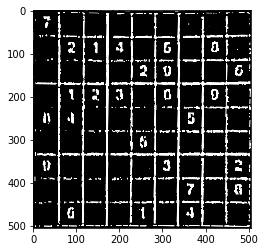

[[3. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 4. 4. 5. 8. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 0. 0.]
 [0. 4. 2. 2. 0. 0. 0. 0. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 4. 0. 4. 0. 0.]] 



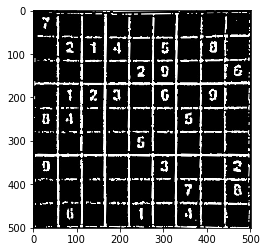

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 9. 4. 5. 5. 0. 8. 0.]
 [0. 0. 0. 0. 2. 7. 0. 0. 6.]
 [0. 1. 2. 3. 0. 0. 0. 9. 0.]
 [0. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 3. 0. 0. 3.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 1. 0. 4. 0. 0.]] 



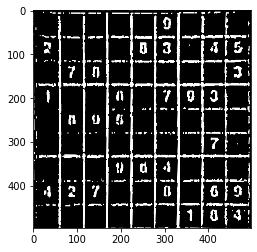

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 5. 7. 0. 8. 5. 0. 4. 5.]
 [0. 7. 1. 0. 5. 7. 5. 0. 3.]
 [7. 0. 0. 1. 0. 7. 0. 3. 0.]
 [0. 6. 1. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 2. 1. 0. 0. 4. 0. 5. 9.]
 [0. 0. 0. 0. 0. 0. 1. 4. 4.]] 



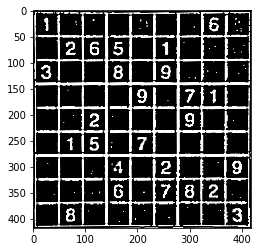

[[9. 0. 0. 0. 4. 0. 0. 5. 0.]
 [0. 7. 8. 5. 0. 4. 0. 0. 0.]
 [3. 0. 0. 8. 0. 9. 0. 0. 0.]
 [0. 0. 0. 0. 9. 0. 7. 1. 0.]
 [0. 0. 2. 0. 0. 0. 9. 0. 0.]
 [0. 9. 5. 0. 7. 0. 0. 0. 0.]
 [0. 0. 0. 4. 0. 2. 0. 0. 9.]
 [0. 0. 0. 6. 0. 2. 8. 2. 0.]
 [0. 8. 0. 0. 0. 0. 0. 0. 3.]] 



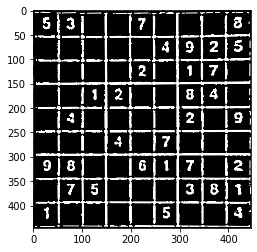

[[5. 3. 0. 0. 7. 0. 0. 0. 8.]
 [0. 5. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 1. 7. 0.]
 [0. 0. 1. 2. 0. 0. 4. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 9.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [2. 4. 0. 0. 5. 1. 3. 0. 2.]
 [0. 3. 5. 0. 0. 0. 4. 4. 1.]
 [7. 0. 0. 0. 0. 9. 0. 0. 4.]] 



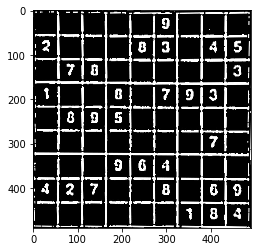

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [7. 0. 0. 0. 0. 3. 9. 3. 0.]
 [0. 4. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 7. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 3. 3. 0. 0. 4. 0. 9. 3.]
 [0. 0. 0. 0. 0. 0. 1. 4. 4.]] 



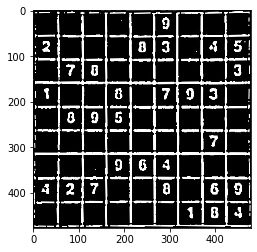

[[0. 0. 0. 0. 0. 7. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 3. 0. 0. 0. 0. 0. 0. 3.]
 [1. 0. 0. 4. 0. 7. 4. 3. 0.]
 [0. 4. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 2. 1. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]] 



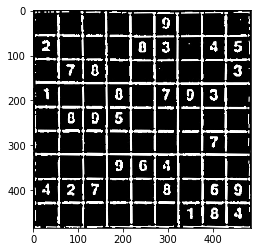

[[0. 0. 0. 0. 0. 7. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [7. 0. 0. 0. 0. 7. 0. 3. 0.]
 [0. 4. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 2. 6. 4. 0. 0. 0.]
 [4. 2. 3. 0. 0. 4. 0. 5. 4.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]] 



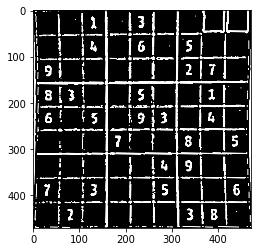

[[0. 0. 1. 0. 3. 0. 0. 1. 1.]
 [0. 0. 4. 0. 6. 0. 5. 0. 0.]
 [3. 0. 0. 0. 0. 0. 2. 0. 0.]
 [8. 3. 0. 0. 5. 0. 0. 5. 0.]
 [4. 0. 5. 0. 9. 3. 0. 4. 0.]
 [0. 0. 0. 3. 0. 0. 9. 0. 7.]
 [0. 0. 0. 0. 0. 4. 3. 0. 0.]
 [7. 0. 3. 0. 0. 5. 0. 0. 9.]
 [0. 2. 0. 0. 0. 0. 3. 4. 0.]] 



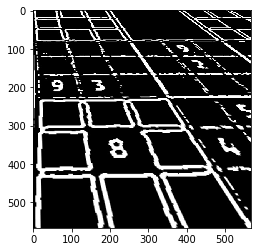

[[5. 5. 5. 4. 0. 0. 7. 5. 5.]
 [5. 5. 5. 5. 5. 5. 2. 5. 5.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 5. 1. 1. 3. 2. 2. 2.]
 [6. 5. 0. 1. 6. 1. 2. 5. 5.]
 [6. 0. 0. 9. 0. 0. 7. 0. 5.]
 [6. 2. 5. 5. 1. 4. 5. 5. 2.]
 [6. 0. 4. 0. 0. 4. 0. 0. 5.]
 [6. 0. 0. 4. 0. 4. 5. 0. 4.]] 



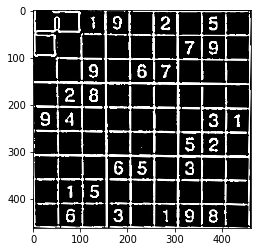

[[5. 0. 1. 9. 0. 2. 0. 5. 0.]
 [1. 0. 0. 0. 0. 0. 7. 9. 0.]
 [0. 0. 9. 0. 5. 7. 0. 0. 0.]
 [0. 2. 8. 0. 0. 0. 0. 0. 0.]
 [9. 4. 0. 0. 0. 0. 0. 3. 1.]
 [0. 0. 0. 0. 0. 0. 5. 2. 0.]
 [0. 0. 0. 6. 5. 0. 3. 0. 0.]
 [0. 1. 5. 0. 0. 0. 0. 0. 0.]
 [0. 6. 0. 3. 0. 1. 9. 8. 0.]] 



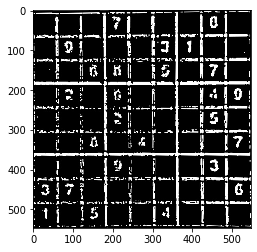

[[0. 0. 0. 7. 0. 0. 0. 0. 0.]
 [0. 7. 0. 0. 0. 3. 8. 0. 0.]
 [0. 0. 5. 4. 0. 5. 0. 7. 0.]
 [0. 3. 0. 8. 0. 0. 0. 4. 4.]
 [0. 0. 0. 3. 0. 0. 0. 5. 0.]
 [0. 0. 4. 0. 4. 0. 0. 0. 7.]
 [0. 0. 0. 2. 0. 0. 0. 2. 0.]
 [2. 3. 0. 0. 0. 0. 0. 0. 4.]
 [7. 0. 2. 0. 0. 4. 0. 0. 0.]] 



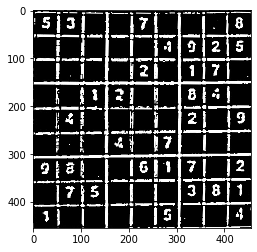

[[5. 2. 5. 0. 7. 0. 0. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 7. 3. 0.]
 [0. 0. 1. 2. 0. 0. 0. 5. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 2.]
 [0. 0. 0. 4. 0. 7. 0. 0. 0.]
 [7. 8. 0. 0. 6. 1. 3. 0. 2.]
 [0. 7. 5. 0. 0. 0. 2. 2. 7.]
 [7. 0. 0. 0. 0. 5. 0. 0. 4.]] 



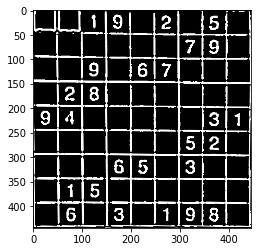

[[3. 1. 1. 9. 0. 2. 0. 5. 0.]
 [0. 0. 0. 0. 0. 0. 7. 9. 0.]
 [0. 0. 9. 0. 6. 7. 0. 0. 0.]
 [0. 2. 8. 0. 0. 0. 0. 0. 0.]
 [5. 4. 0. 0. 0. 0. 0. 3. 1.]
 [0. 0. 0. 0. 0. 0. 5. 2. 0.]
 [0. 0. 0. 6. 5. 0. 3. 0. 0.]
 [0. 1. 5. 0. 0. 0. 0. 0. 0.]
 [0. 6. 0. 3. 0. 1. 9. 8. 0.]] 



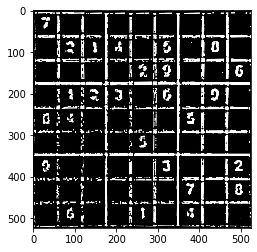

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 1. 4. 0. 5. 0. 0. 0.]
 [0. 0. 0. 0. 2. 2. 0. 0. 5.]
 [0. 1. 2. 2. 0. 6. 0. 2. 0.]
 [0. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 4. 0. 4. 0. 0.]] 



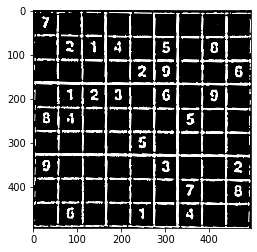

[[7. 0. 0. 0. 0. 0. 0. 2. 0.]
 [0. 2. 1. 4. 0. 5. 5. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 0. 6.]
 [0. 1. 2. 3. 0. 0. 0. 9. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 3. 0. 4. 0. 0.]] 



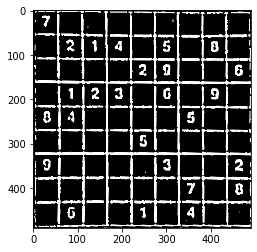

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 1. 4. 0. 5. 0. 0. 0.]
 [0. 0. 0. 0. 2. 2. 0. 0. 0.]
 [0. 7. 2. 2. 0. 6. 0. 9. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 4. 0. 4.]
 [0. 4. 0. 0. 7. 0. 4. 0. 0.]] 



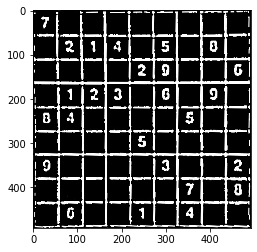

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 1. 4. 0. 5. 0. 4. 0.]
 [0. 0. 0. 0. 2. 7. 0. 0. 5.]
 [0. 1. 2. 2. 0. 5. 0. 4. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 3. 0. 4. 0. 0.]] 



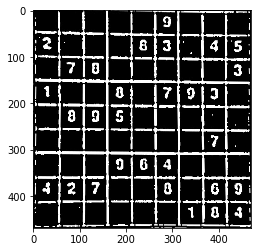

[[0. 0. 0. 0. 0. 2. 0. 0. 0.]
 [3. 0. 0. 0. 4. 2. 0. 4. 5.]
 [0. 7. 4. 0. 0. 0. 0. 0. 3.]
 [7. 0. 0. 4. 0. 3. 4. 2. 0.]
 [0. 4. 4. 5. 0. 0. 0. 0. 0.]
 [5. 3. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [7. 6. 4. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]] 



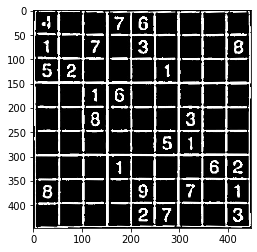

[[4. 0. 0. 7. 8. 0. 0. 0. 0.]
 [1. 0. 7. 0. 3. 0. 0. 0. 8.]
 [5. 2. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 9. 6. 0. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 0. 5. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 5. 2.]
 [8. 0. 0. 0. 8. 0. 2. 0. 1.]
 [0. 0. 0. 0. 2. 3. 0. 0. 3.]] 



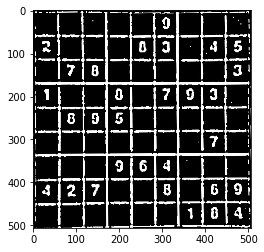

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 0. 0. 0. 3. 0. 4. 5.]
 [0. 7. 0. 0. 0. 0. 0. 0. 3.]
 [1. 0. 0. 0. 0. 3. 9. 3. 0.]
 [0. 0. 2. 5. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 3. 0.]
 [0. 0. 0. 2. 6. 4. 0. 0. 0.]
 [4. 2. 2. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]] 



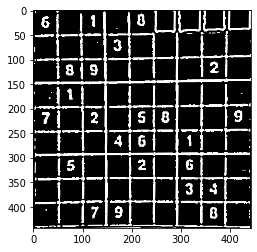

[[6. 0. 1. 0. 4. 1. 5. 1. 1.]
 [0. 0. 0. 2. 0. 0. 0. 0. 0.]
 [0. 8. 9. 0. 0. 0. 0. 2. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [3. 0. 2. 0. 5. 4. 0. 0. 4.]
 [0. 0. 0. 4. 5. 0. 1. 0. 0.]
 [0. 5. 0. 0. 3. 0. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 4. 3. 0. 0. 0. 4. 0.]] 



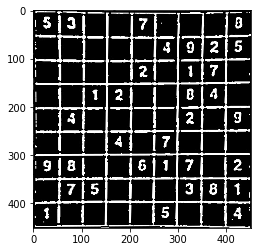

[[5. 0. 5. 5. 7. 0. 0. 0. 0.]
 [0. 6. 5. 5. 5. 4. 0. 2. 5.]
 [0. 6. 6. 0. 2. 0. 1. 7. 0.]
 [0. 0. 7. 2. 0. 0. 0. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 9.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [2. 2. 0. 0. 5. 1. 0. 0. 2.]
 [0. 7. 7. 0. 0. 0. 4. 4. 4.]
 [3. 0. 0. 0. 0. 4. 0. 0. 4.]] 



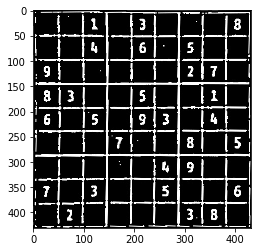

[[0. 0. 1. 0. 3. 0. 0. 0. 8.]
 [0. 0. 6. 0. 8. 0. 5. 0. 0.]
 [3. 0. 0. 0. 0. 0. 2. 8. 0.]
 [8. 3. 0. 0. 5. 0. 0. 1. 0.]
 [6. 0. 5. 0. 9. 3. 0. 4. 0.]
 [0. 0. 0. 3. 0. 0. 4. 0. 5.]
 [0. 0. 0. 0. 0. 4. 9. 0. 0.]
 [3. 0. 3. 0. 0. 5. 0. 0. 5.]
 [0. 2. 0. 0. 0. 0. 3. 4. 0.]] 



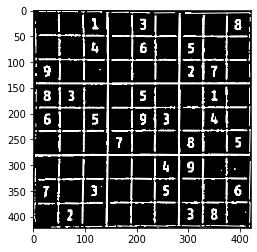

[[0. 0. 1. 0. 3. 0. 0. 0. 8.]
 [0. 0. 6. 0. 8. 0. 5. 0. 0.]
 [3. 0. 0. 0. 0. 0. 2. 7. 0.]
 [8. 3. 0. 0. 5. 0. 0. 1. 0.]
 [6. 0. 5. 0. 3. 3. 0. 4. 0.]
 [0. 0. 0. 7. 0. 0. 4. 0. 5.]
 [0. 0. 0. 0. 0. 4. 9. 0. 0.]
 [7. 0. 3. 0. 0. 5. 0. 0. 5.]
 [0. 2. 0. 0. 0. 0. 3. 4. 0.]] 



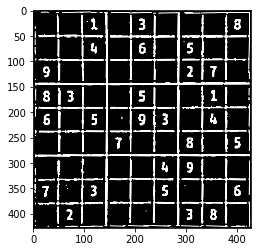

[[0. 0. 1. 0. 3. 0. 0. 0. 8.]
 [0. 0. 6. 0. 8. 0. 5. 0. 0.]
 [5. 0. 0. 0. 0. 0. 2. 8. 0.]
 [8. 3. 0. 0. 5. 0. 0. 1. 0.]
 [5. 0. 5. 0. 9. 3. 0. 6. 0.]
 [0. 0. 0. 3. 0. 0. 8. 0. 5.]
 [0. 0. 0. 0. 0. 4. 9. 0. 0.]
 [3. 0. 3. 0. 0. 5. 0. 0. 5.]
 [0. 2. 0. 0. 0. 0. 3. 4. 0.]] 



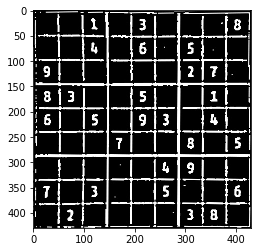

[[0. 0. 1. 0. 3. 0. 0. 0. 8.]
 [0. 0. 6. 0. 8. 0. 5. 0. 0.]
 [3. 0. 0. 0. 0. 0. 2. 8. 0.]
 [8. 3. 0. 0. 5. 0. 0. 1. 0.]
 [6. 0. 5. 0. 9. 3. 0. 4. 0.]
 [0. 0. 0. 7. 0. 0. 8. 0. 5.]
 [0. 0. 0. 0. 0. 4. 9. 0. 0.]
 [7. 0. 3. 0. 0. 5. 0. 0. 8.]
 [0. 2. 0. 0. 0. 0. 3. 4. 0.]] 



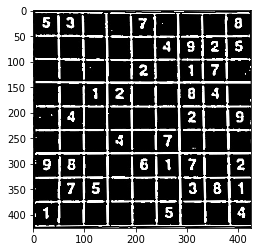

[[5. 3. 0. 0. 7. 5. 5. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 1. 3. 0.]
 [0. 0. 2. 2. 0. 0. 4. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 8.]
 [0. 0. 0. 4. 0. 7. 0. 0. 0.]
 [7. 4. 0. 0. 4. 7. 7. 0. 3.]
 [0. 4. 2. 0. 0. 1. 2. 4. 7.]
 [7. 0. 0. 0. 0. 2. 0. 4. 7.]] 



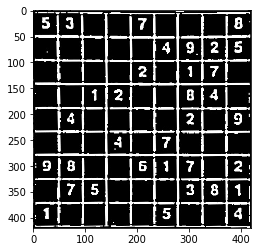

[[5. 3. 0. 0. 7. 5. 5. 0. 8.]
 [0. 0. 0. 5. 5. 4. 5. 2. 5.]
 [0. 0. 5. 0. 2. 0. 1. 7. 0.]
 [0. 0. 1. 2. 0. 0. 8. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 9.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [2. 4. 0. 0. 5. 1. 3. 0. 2.]
 [0. 3. 5. 0. 0. 0. 2. 4. 1.]
 [7. 0. 0. 0. 0. 5. 0. 0. 4.]] 



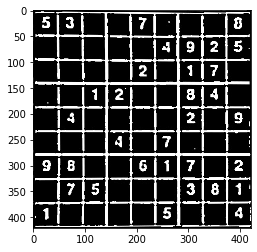

[[5. 2. 0. 0. 7. 5. 0. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 1. 3. 0.]
 [0. 0. 1. 2. 0. 0. 8. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 9.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [2. 4. 0. 0. 6. 7. 3. 0. 2.]
 [0. 3. 5. 0. 0. 0. 2. 4. 3.]
 [7. 0. 0. 0. 0. 7. 0. 0. 4.]] 



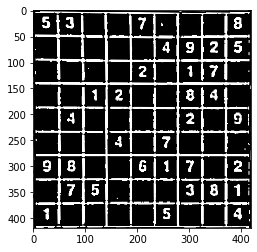

[[5. 3. 0. 0. 7. 5. 0. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 8. 7. 0.]
 [0. 0. 7. 2. 0. 0. 8. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 9.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [3. 4. 0. 0. 6. 1. 3. 0. 2.]
 [0. 3. 5. 0. 0. 0. 2. 4. 1.]
 [7. 0. 0. 0. 0. 5. 0. 0. 4.]] 



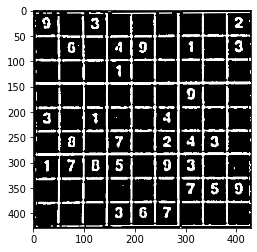

[[0. 0. 3. 0. 0. 0. 0. 0. 2.]
 [0. 5. 5. 4. 9. 0. 1. 0. 2.]
 [0. 0. 0. 7. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 0. 0.]
 [2. 0. 7. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 7. 0. 2. 4. 2. 0.]
 [2. 7. 4. 5. 0. 4. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



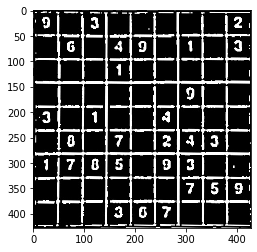

[[0. 0. 2. 0. 0. 0. 0. 0. 2.]
 [0. 5. 0. 4. 9. 0. 1. 0. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 0. 0.]
 [2. 0. 7. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [4. 3. 4. 4. 0. 4. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 4. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



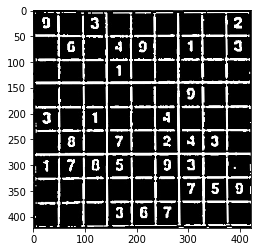

[[0. 0. 3. 0. 0. 0. 0. 0. 2.]
 [0. 6. 0. 4. 0. 0. 1. 0. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 0. 0.]
 [2. 0. 7. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [7. 7. 4. 6. 0. 4. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 3. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



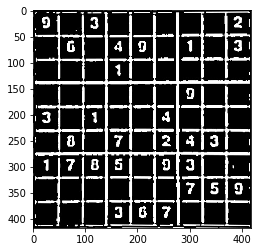

[[0. 0. 2. 0. 0. 0. 0. 0. 2.]
 [0. 6. 0. 4. 9. 0. 1. 0. 2.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 0. 0.]
 [2. 0. 1. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [7. 3. 4. 4. 0. 4. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 4. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



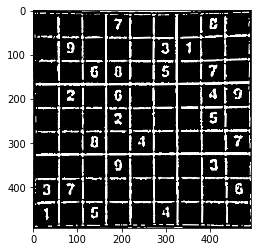

[[0. 0. 0. 7. 0. 0. 0. 8. 0.]
 [0. 9. 0. 5. 5. 5. 8. 0. 0.]
 [0. 0. 6. 0. 0. 5. 0. 7. 0.]
 [0. 2. 0. 6. 0. 0. 0. 4. 9.]
 [0. 0. 0. 2. 0. 0. 0. 5. 0.]
 [0. 0. 4. 0. 4. 0. 0. 0. 3.]
 [0. 0. 0. 4. 0. 0. 0. 2. 0.]
 [2. 3. 0. 0. 0. 0. 0. 0. 4.]
 [7. 0. 4. 0. 0. 4. 0. 0. 0.]] 



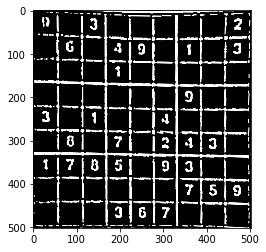

[[4. 0. 5. 0. 5. 5. 0. 0. 7.]
 [0. 6. 0. 5. 5. 5. 8. 5. 5.]
 [0. 0. 0. 8. 5. 5. 5. 5. 5.]
 [0. 0. 0. 0. 0. 5. 9. 5. 5.]
 [2. 0. 1. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 3. 0.]
 [4. 3. 4. 5. 0. 4. 3. 0. 0.]
 [0. 0. 0. 0. 0. 0. 3. 5. 9.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



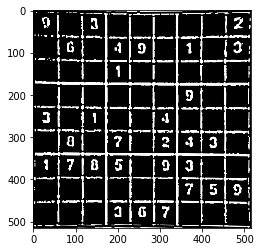

[[7. 0. 5. 0. 0. 0. 0. 0. 2.]
 [0. 6. 0. 5. 5. 5. 8. 5. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 7. 0. 0.]
 [2. 0. 1. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 3. 0.]
 [7. 1. 4. 5. 0. 4. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 5. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



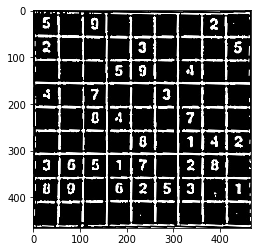

[[5. 0. 5. 5. 0. 2. 5. 2. 5.]
 [2. 0. 0. 5. 5. 0. 0. 0. 5.]
 [0. 0. 0. 5. 0. 0. 4. 0. 0.]
 [4. 0. 2. 0. 0. 3. 0. 0. 0.]
 [0. 0. 4. 4. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 4. 0. 1. 4. 2.]
 [2. 4. 6. 7. 3. 0. 3. 4. 0.]
 [4. 4. 0. 4. 3. 5. 4. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]] 



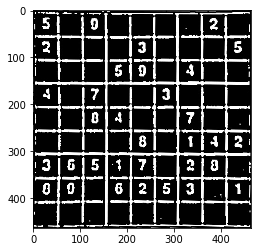

[[5. 0. 5. 5. 5. 0. 0. 2. 0.]
 [2. 0. 5. 5. 5. 5. 0. 0. 5.]
 [0. 0. 0. 5. 0. 0. 4. 0. 0.]
 [4. 0. 7. 0. 0. 2. 0. 0. 0.]
 [0. 0. 4. 4. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 4. 0. 1. 4. 2.]
 [2. 4. 5. 7. 3. 0. 2. 4. 0.]
 [4. 4. 0. 4. 2. 5. 4. 0. 3.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]] 



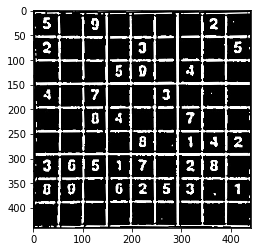

[[5. 0. 5. 5. 5. 0. 2. 2. 0.]
 [2. 5. 5. 5. 2. 0. 0. 0. 5.]
 [0. 6. 0. 5. 0. 0. 4. 0. 0.]
 [4. 0. 2. 0. 0. 2. 0. 0. 0.]
 [0. 0. 4. 4. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 4. 0. 1. 4. 2.]
 [2. 4. 6. 7. 3. 0. 2. 4. 0.]
 [4. 4. 0. 4. 2. 5. 4. 0. 3.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]] 



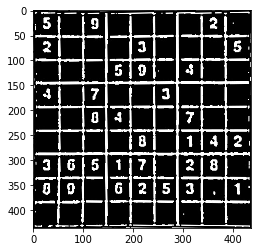

[[5. 0. 5. 0. 0. 0. 0. 2. 0.]
 [2. 5. 5. 0. 5. 0. 0. 0. 5.]
 [0. 7. 0. 5. 8. 0. 4. 0. 0.]
 [4. 0. 2. 0. 0. 2. 0. 0. 0.]
 [0. 0. 4. 4. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 4. 0. 1. 4. 2.]
 [2. 4. 5. 7. 3. 0. 2. 4. 0.]
 [4. 4. 0. 4. 2. 5. 4. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]] 



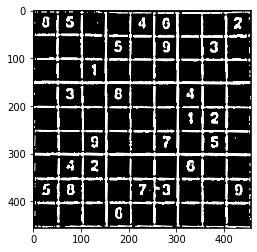

[[0. 5. 0. 0. 4. 0. 0. 0. 2.]
 [0. 0. 0. 5. 0. 0. 0. 3. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 2. 0. 4. 0. 0. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 2. 0.]
 [0. 0. 4. 0. 0. 3. 0. 5. 0.]
 [0. 4. 2. 0. 0. 0. 4. 0. 0.]
 [5. 4. 0. 0. 3. 2. 0. 0. 4.]
 [0. 0. 0. 4. 0. 0. 0. 0. 0.]] 



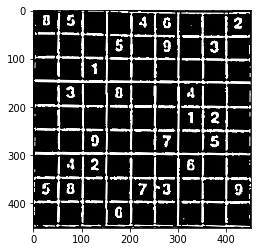

[[4. 5. 0. 0. 4. 0. 5. 0. 2.]
 [0. 0. 0. 5. 0. 9. 0. 3. 0.]
 [0. 0. 7. 0. 0. 0. 0. 0. 0.]
 [0. 2. 0. 4. 0. 0. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 2. 0.]
 [0. 0. 4. 0. 0. 3. 0. 5. 0.]
 [0. 4. 2. 0. 0. 0. 4. 0. 0.]
 [4. 4. 0. 0. 1. 4. 0. 0. 4.]
 [0. 0. 0. 4. 0. 0. 0. 0. 0.]] 



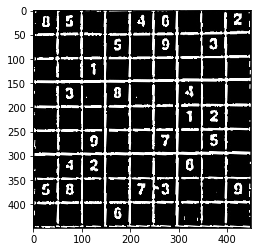

[[4. 5. 0. 0. 4. 4. 0. 0. 4.]
 [0. 0. 0. 5. 0. 4. 0. 2. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 2. 0. 4. 0. 0. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 2. 0.]
 [0. 0. 4. 0. 0. 3. 0. 3. 0.]
 [0. 4. 2. 0. 0. 0. 4. 0. 0.]
 [5. 4. 0. 0. 3. 4. 0. 0. 4.]
 [0. 0. 0. 4. 0. 0. 0. 0. 0.]] 



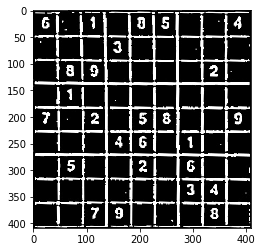

[[6. 0. 8. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 3. 0. 0. 0. 0. 0.]
 [0. 8. 9. 0. 0. 0. 0. 2. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [7. 0. 2. 0. 5. 8. 0. 0. 9.]
 [0. 0. 0. 4. 6. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 5. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 7. 4. 0. 0. 0. 4. 0.]] 



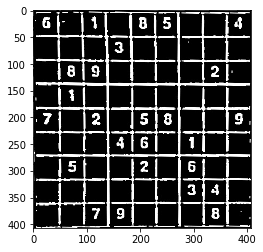

[[5. 0. 9. 0. 8. 5. 0. 0. 4.]
 [0. 0. 0. 5. 0. 0. 5. 0. 0.]
 [0. 8. 0. 0. 5. 5. 0. 2. 0.]
 [0. 7. 0. 0. 0. 0. 0. 0. 0.]
 [2. 4. 2. 0. 5. 8. 0. 0. 9.]
 [0. 0. 4. 4. 6. 0. 1. 0. 0.]
 [0. 6. 4. 0. 2. 0. 6. 0. 0.]
 [0. 6. 4. 6. 0. 0. 2. 4. 0.]
 [0. 0. 7. 0. 0. 0. 0. 4. 0.]] 



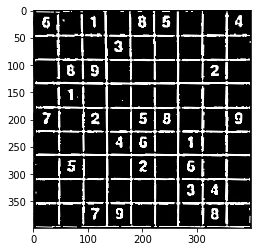

[[5. 0. 1. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 3. 0. 0. 0. 0. 0.]
 [0. 8. 5. 0. 0. 0. 0. 2. 0.]
 [0. 2. 0. 0. 0. 0. 0. 0. 0.]
 [3. 0. 2. 0. 5. 8. 0. 0. 9.]
 [0. 0. 0. 4. 6. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 6. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 3. 4. 0. 0. 0. 4. 0.]] 



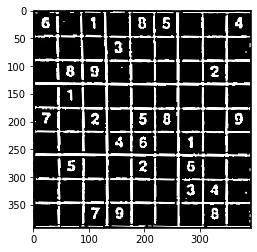

[[6. 0. 1. 0. 0. 5. 0. 0. 4.]
 [0. 0. 0. 2. 0. 0. 0. 0. 0.]
 [0. 8. 8. 0. 0. 0. 0. 2. 0.]
 [0. 7. 0. 0. 0. 0. 0. 0. 0.]
 [3. 0. 2. 0. 5. 8. 0. 0. 9.]
 [0. 0. 0. 4. 6. 0. 1. 0. 0.]
 [0. 5. 0. 0. 2. 0. 6. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 4. 0.]
 [0. 0. 3. 4. 0. 0. 0. 4. 0.]] 



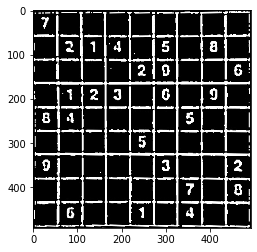

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 1. 4. 0. 5. 0. 8. 0.]
 [0. 0. 0. 0. 2. 0. 0. 0. 5.]
 [0. 1. 2. 2. 0. 5. 0. 4. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 9. 0. 4.]
 [0. 4. 0. 0. 3. 0. 4. 0. 0.]] 



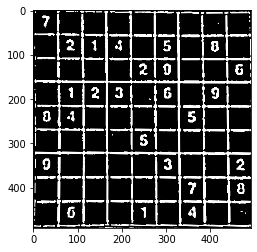

[[7. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 7. 4. 0. 5. 0. 0. 0.]
 [0. 0. 0. 0. 2. 4. 0. 0. 6.]
 [0. 7. 2. 2. 0. 6. 0. 9. 0.]
 [4. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 5. 5. 0. 4. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 5. 0. 0. 0. 4. 0. 4.]
 [0. 4. 0. 0. 7. 0. 4. 0. 0.]] 



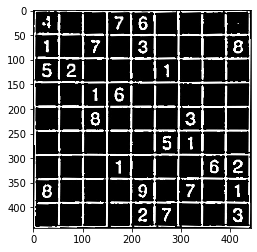

[[4. 0. 0. 7. 6. 0. 0. 0. 0.]
 [1. 0. 7. 0. 3. 0. 0. 0. 8.]
 [5. 2. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 6. 0. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 0. 5. 1. 0. 0.]
 [0. 0. 0. 7. 0. 0. 0. 6. 2.]
 [8. 0. 0. 0. 9. 0. 2. 0. 1.]
 [0. 0. 0. 0. 2. 2. 0. 0. 3.]] 



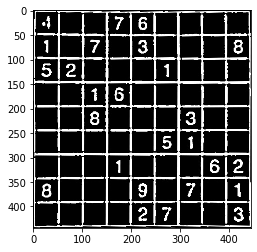

[[4. 0. 0. 7. 6. 0. 0. 0. 0.]
 [1. 0. 7. 0. 3. 0. 0. 0. 8.]
 [5. 2. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 7. 6. 0. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 0. 5. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 6. 2.]
 [8. 0. 0. 0. 4. 0. 1. 0. 1.]
 [0. 0. 0. 0. 2. 1. 0. 0. 3.]] 



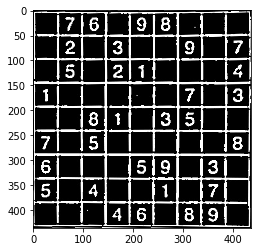

[[0. 7. 8. 0. 9. 8. 0. 0. 0.]
 [0. 2. 0. 3. 0. 0. 9. 0. 7.]
 [0. 5. 0. 2. 7. 0. 0. 0. 4.]
 [1. 0. 0. 0. 0. 0. 7. 0. 3.]
 [0. 0. 8. 1. 0. 3. 5. 0. 0.]
 [7. 0. 5. 0. 0. 0. 0. 0. 8.]
 [6. 0. 0. 0. 5. 9. 0. 3. 0.]
 [5. 0. 4. 0. 0. 1. 0. 2. 0.]
 [0. 0. 0. 4. 6. 0. 8. 9. 0.]] 



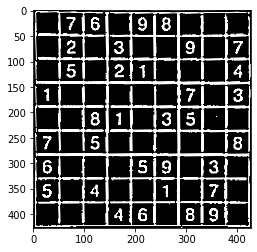

[[0. 7. 6. 0. 9. 8. 0. 0. 0.]
 [0. 2. 0. 3. 0. 0. 9. 0. 7.]
 [0. 5. 0. 2. 7. 0. 0. 0. 4.]
 [7. 0. 0. 0. 0. 0. 7. 0. 3.]
 [0. 0. 8. 1. 0. 3. 5. 0. 0.]
 [2. 0. 5. 0. 0. 0. 0. 0. 8.]
 [6. 0. 0. 0. 5. 9. 0. 3. 0.]
 [5. 0. 4. 0. 0. 1. 0. 2. 0.]
 [0. 0. 0. 4. 6. 0. 4. 9. 0.]] 



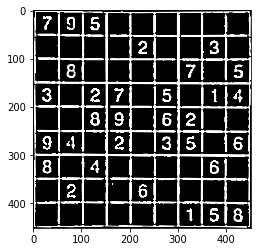

[[7. 0. 5. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 3. 0.]
 [0. 8. 0. 0. 0. 0. 7. 0. 5.]
 [3. 0. 2. 7. 0. 5. 0. 1. 4.]
 [0. 0. 8. 9. 0. 6. 2. 0. 0.]
 [8. 4. 0. 2. 0. 3. 5. 0. 5.]
 [8. 0. 4. 0. 0. 0. 0. 6. 0.]
 [0. 2. 0. 0. 6. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 5. 8.]] 



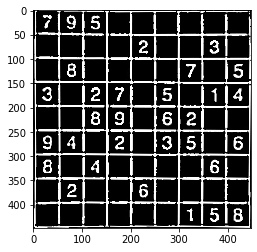

[[2. 8. 5. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 3. 0.]
 [0. 8. 0. 0. 0. 0. 7. 0. 5.]
 [3. 0. 2. 2. 0. 5. 0. 1. 4.]
 [0. 0. 8. 8. 0. 6. 2. 0. 0.]
 [8. 4. 0. 2. 0. 3. 5. 0. 5.]
 [8. 0. 4. 0. 0. 0. 0. 6. 0.]
 [0. 2. 0. 0. 6. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 5. 8.]] 



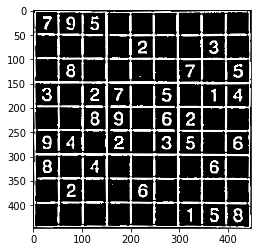

[[7. 9. 5. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 3. 0.]
 [0. 8. 0. 0. 0. 0. 7. 0. 5.]
 [3. 0. 2. 7. 0. 5. 0. 1. 4.]
 [0. 0. 8. 9. 0. 6. 2. 0. 0.]
 [8. 4. 0. 2. 0. 3. 5. 0. 5.]
 [8. 0. 4. 0. 0. 0. 0. 5. 0.]
 [0. 2. 0. 0. 6. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 5. 8.]] 



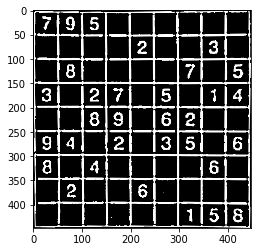

[[7. 9. 5. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 3. 0.]
 [0. 8. 0. 0. 0. 0. 7. 0. 5.]
 [3. 0. 2. 7. 0. 5. 0. 1. 4.]
 [0. 0. 8. 9. 0. 5. 2. 0. 0.]
 [8. 4. 0. 2. 0. 3. 5. 0. 5.]
 [8. 0. 4. 0. 0. 0. 0. 5. 0.]
 [0. 2. 0. 0. 6. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 5. 8.]] 



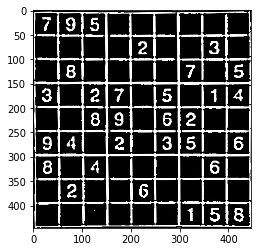

[[7. 9. 5. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 2. 0. 0. 3. 0.]
 [0. 8. 0. 0. 0. 0. 7. 0. 5.]
 [3. 0. 2. 7. 0. 5. 0. 7. 4.]
 [0. 0. 8. 8. 0. 6. 2. 0. 0.]
 [8. 4. 0. 2. 0. 3. 5. 0. 5.]
 [8. 0. 4. 0. 0. 0. 0. 6. 0.]
 [0. 2. 0. 0. 6. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 5. 8.]] 



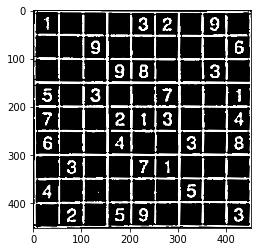

[[7. 0. 0. 0. 3. 7. 0. 9. 0.]
 [0. 0. 8. 0. 0. 0. 0. 0. 5.]
 [0. 0. 0. 8. 8. 0. 0. 3. 0.]
 [5. 0. 3. 0. 0. 7. 0. 0. 1.]
 [7. 0. 0. 2. 1. 3. 0. 0. 4.]
 [6. 0. 0. 4. 0. 0. 3. 0. 8.]
 [0. 8. 0. 0. 2. 7. 0. 0. 0.]
 [4. 0. 0. 0. 0. 0. 5. 0. 0.]
 [0. 2. 0. 5. 8. 0. 0. 0. 3.]] 



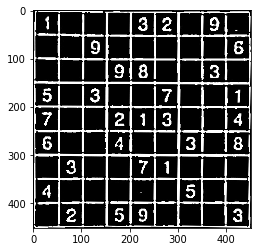

[[4. 0. 0. 0. 3. 7. 0. 9. 0.]
 [0. 0. 5. 0. 0. 0. 0. 0. 8.]
 [0. 0. 0. 9. 8. 0. 0. 3. 0.]
 [5. 0. 3. 0. 0. 7. 0. 0. 7.]
 [7. 0. 0. 2. 7. 3. 0. 0. 4.]
 [6. 0. 0. 4. 0. 0. 3. 0. 8.]
 [0. 3. 0. 0. 7. 1. 0. 0. 0.]
 [4. 0. 0. 0. 0. 0. 5. 0. 0.]
 [0. 2. 0. 5. 9. 0. 0. 0. 3.]] 



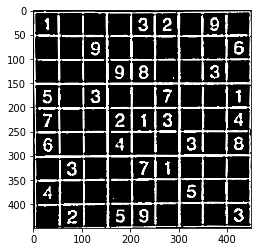

[[9. 0. 0. 0. 5. 7. 0. 9. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 8.]
 [0. 0. 0. 9. 8. 0. 0. 3. 0.]
 [5. 0. 0. 0. 0. 7. 0. 0. 1.]
 [7. 0. 0. 0. 9. 3. 0. 0. 4.]
 [5. 0. 0. 4. 0. 0. 3. 0. 8.]
 [0. 8. 0. 0. 7. 7. 0. 0. 0.]
 [4. 0. 0. 0. 0. 0. 5. 0. 0.]
 [0. 2. 0. 5. 8. 0. 0. 0. 3.]] 



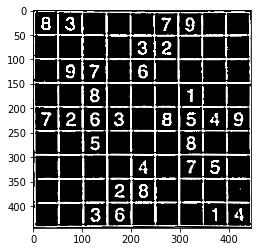

[[8. 3. 0. 0. 0. 7. 9. 0. 0.]
 [0. 0. 0. 0. 3. 2. 0. 0. 0.]
 [0. 9. 7. 0. 6. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 7. 0. 0.]
 [7. 2. 6. 3. 0. 8. 5. 4. 9.]
 [0. 0. 5. 0. 0. 0. 8. 0. 0.]
 [0. 0. 0. 0. 4. 0. 7. 5. 0.]
 [0. 0. 0. 2. 8. 0. 0. 0. 0.]
 [0. 0. 6. 6. 0. 0. 0. 1. 4.]] 



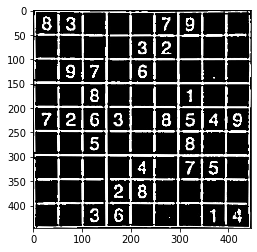

[[8. 3. 0. 0. 0. 7. 9. 0. 0.]
 [0. 0. 0. 0. 3. 2. 0. 0. 0.]
 [0. 9. 7. 0. 5. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 1. 0. 0.]
 [7. 2. 6. 3. 0. 8. 5. 4. 9.]
 [0. 0. 5. 0. 0. 0. 8. 0. 0.]
 [0. 0. 0. 0. 4. 0. 7. 5. 0.]
 [0. 0. 0. 2. 8. 0. 0. 0. 0.]
 [0. 0. 3. 6. 0. 0. 0. 1. 4.]] 



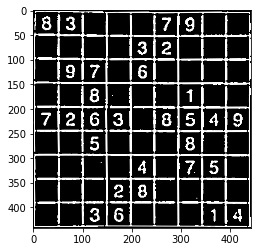

[[8. 3. 0. 0. 0. 7. 9. 0. 0.]
 [0. 0. 0. 0. 3. 7. 0. 0. 0.]
 [0. 9. 7. 0. 5. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 7. 0. 0.]
 [7. 2. 6. 3. 0. 8. 5. 4. 9.]
 [0. 0. 5. 0. 0. 0. 8. 0. 0.]
 [0. 0. 0. 0. 4. 0. 7. 5. 0.]
 [0. 0. 0. 2. 8. 0. 0. 0. 0.]
 [0. 0. 3. 6. 0. 0. 0. 1. 4.]] 



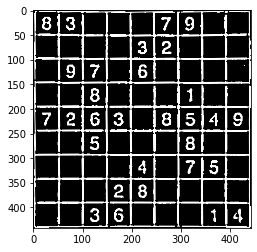

[[8. 5. 0. 0. 0. 7. 9. 0. 0.]
 [0. 0. 0. 0. 3. 2. 0. 0. 0.]
 [0. 5. 7. 0. 6. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 1. 0. 0.]
 [7. 2. 6. 3. 0. 8. 5. 4. 9.]
 [0. 0. 5. 0. 0. 0. 8. 0. 0.]
 [0. 0. 0. 0. 4. 0. 7. 5. 0.]
 [0. 0. 0. 2. 8. 0. 0. 0. 0.]
 [0. 0. 3. 6. 0. 0. 0. 1. 4.]] 



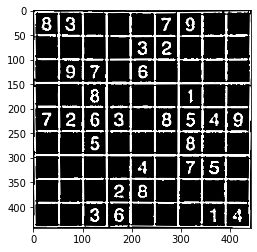

[[8. 5. 0. 0. 0. 7. 9. 0. 0.]
 [0. 0. 0. 0. 3. 7. 0. 0. 0.]
 [0. 5. 7. 0. 5. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 9. 0. 0.]
 [7. 2. 6. 3. 0. 8. 5. 4. 9.]
 [0. 0. 5. 0. 0. 0. 8. 0. 0.]
 [0. 0. 0. 0. 4. 0. 7. 5. 0.]
 [0. 0. 0. 2. 8. 0. 0. 0. 0.]
 [0. 0. 3. 6. 0. 0. 0. 1. 4.]] 



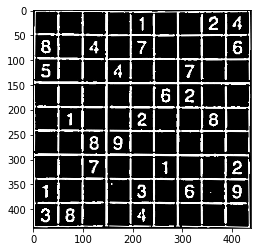

[[0. 0. 0. 0. 9. 0. 0. 2. 4.]
 [8. 0. 4. 0. 7. 0. 0. 0. 8.]
 [5. 0. 0. 4. 0. 0. 7. 0. 0.]
 [0. 0. 0. 0. 0. 5. 2. 0. 0.]
 [0. 7. 0. 0. 2. 0. 0. 8. 0.]
 [0. 0. 8. 9. 0. 0. 0. 0. 0.]
 [0. 0. 7. 0. 0. 1. 0. 0. 2.]
 [1. 0. 0. 0. 3. 0. 5. 0. 9.]
 [3. 8. 0. 0. 4. 0. 0. 0. 0.]] 



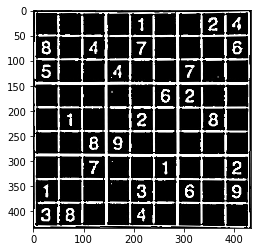

[[0. 0. 0. 0. 1. 0. 0. 7. 4.]
 [8. 0. 4. 0. 7. 0. 0. 0. 8.]
 [5. 0. 0. 4. 0. 0. 7. 0. 0.]
 [0. 0. 0. 0. 0. 5. 2. 0. 0.]
 [0. 1. 0. 0. 2. 0. 0. 8. 0.]
 [0. 0. 8. 9. 0. 0. 0. 0. 0.]
 [0. 0. 7. 0. 0. 1. 0. 0. 2.]
 [1. 0. 0. 0. 3. 0. 5. 0. 9.]
 [3. 0. 0. 0. 4. 0. 0. 0. 0.]] 



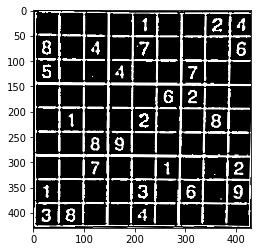

[[0. 0. 6. 6. 7. 7. 7. 7. 4.]
 [8. 0. 4. 6. 7. 7. 6. 6. 8.]
 [5. 0. 0. 4. 4. 6. 7. 7. 0.]
 [0. 0. 0. 0. 0. 6. 0. 7. 7.]
 [0. 7. 0. 0. 0. 0. 0. 8. 0.]
 [0. 0. 8. 9. 0. 0. 0. 0. 0.]
 [0. 0. 7. 0. 0. 9. 0. 0. 2.]
 [7. 0. 0. 0. 3. 0. 6. 0. 9.]
 [3. 0. 0. 0. 4. 0. 0. 0. 0.]] 



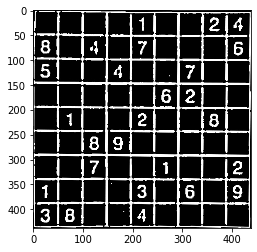

[[0. 0. 0. 0. 4. 0. 0. 7. 8.]
 [8. 0. 4. 0. 7. 0. 0. 0. 8.]
 [5. 0. 0. 4. 0. 0. 7. 0. 0.]
 [0. 0. 0. 0. 0. 5. 2. 0. 0.]
 [0. 7. 0. 0. 2. 0. 0. 8. 0.]
 [0. 0. 8. 9. 0. 0. 0. 0. 0.]
 [0. 0. 7. 0. 0. 1. 0. 0. 2.]
 [1. 0. 0. 0. 3. 0. 5. 0. 9.]
 [3. 8. 0. 0. 4. 0. 0. 0. 0.]] 



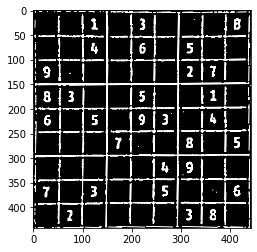

[[0. 0. 1. 0. 3. 0. 0. 0. 8.]
 [0. 0. 8. 0. 8. 0. 5. 0. 0.]
 [5. 0. 0. 0. 0. 0. 2. 8. 0.]
 [8. 3. 0. 0. 5. 0. 0. 8. 0.]
 [8. 0. 5. 0. 9. 3. 0. 4. 0.]
 [0. 0. 0. 7. 0. 0. 8. 0. 5.]
 [0. 0. 0. 0. 0. 4. 9. 0. 0.]
 [7. 0. 3. 0. 0. 5. 0. 0. 9.]
 [0. 2. 0. 0. 0. 0. 3. 4. 0.]] 



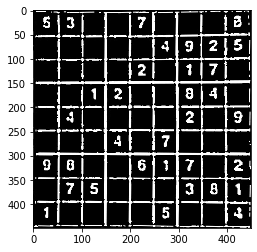

[[5. 2. 0. 0. 7. 0. 0. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 3. 7. 0.]
 [0. 0. 1. 2. 0. 0. 4. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 3.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [4. 4. 0. 0. 4. 1. 3. 0. 2.]
 [0. 1. 7. 0. 0. 0. 4. 4. 1.]
 [4. 0. 0. 0. 0. 5. 0. 0. 4.]] 



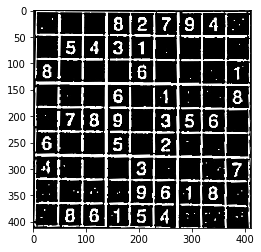

[[5. 0. 0. 8. 7. 7. 9. 8. 0.]
 [0. 5. 4. 3. 9. 0. 0. 0. 0.]
 [8. 0. 0. 0. 8. 0. 0. 0. 4.]
 [0. 0. 0. 5. 0. 1. 0. 0. 8.]
 [0. 7. 8. 9. 0. 3. 5. 8. 0.]
 [6. 0. 0. 5. 0. 2. 0. 0. 0.]
 [4. 0. 0. 0. 3. 0. 0. 0. 7.]
 [0. 0. 0. 0. 9. 8. 8. 8. 0.]
 [0. 8. 6. 1. 5. 4. 0. 0. 0.]] 



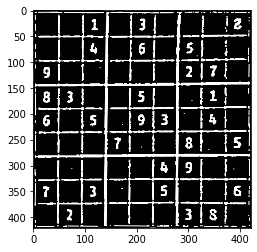

[[0. 0. 9. 0. 3. 0. 0. 0. 8.]
 [0. 0. 6. 0. 8. 0. 5. 0. 0.]
 [5. 0. 0. 0. 0. 0. 2. 8. 0.]
 [8. 3. 0. 0. 5. 0. 0. 8. 0.]
 [8. 0. 5. 0. 9. 3. 0. 4. 0.]
 [0. 0. 0. 7. 0. 0. 8. 0. 5.]
 [0. 0. 0. 0. 0. 4. 9. 0. 0.]
 [3. 0. 3. 0. 0. 5. 0. 0. 5.]
 [0. 2. 0. 0. 0. 0. 3. 5. 0.]] 



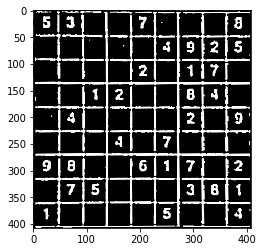

[[5. 2. 0. 0. 7. 0. 0. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 1. 7. 0.]
 [0. 0. 7. 2. 0. 0. 8. 4. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 4.]
 [0. 0. 0. 4. 0. 3. 0. 0. 0.]
 [2. 4. 0. 0. 6. 1. 3. 0. 3.]
 [0. 3. 5. 0. 0. 0. 2. 4. 1.]
 [7. 0. 0. 0. 0. 5. 0. 0. 4.]] 



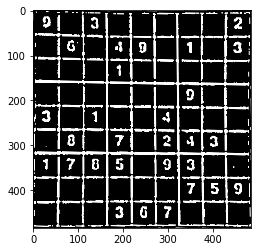

[[0. 0. 2. 0. 0. 0. 0. 0. 2.]
 [0. 6. 0. 4. 0. 5. 1. 0. 3.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [2. 0. 7. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 2. 0.]
 [4. 1. 4. 4. 0. 4. 4. 0. 0.]
 [0. 0. 0. 0. 0. 0. 4. 4. 4.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



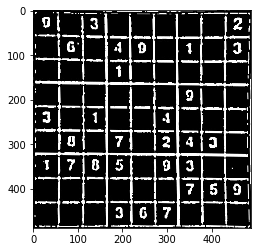

[[0. 0. 5. 0. 0. 0. 0. 0. 2.]
 [0. 6. 0. 4. 0. 5. 4. 5. 3.]
 [0. 0. 0. 9. 0. 5. 5. 5. 5.]
 [0. 0. 0. 0. 0. 0. 7. 0. 0.]
 [2. 0. 7. 0. 0. 4. 0. 0. 0.]
 [0. 4. 0. 3. 0. 2. 4. 3. 0.]
 [7. 7. 4. 5. 0. 4. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0. 3. 5. 2.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]] 



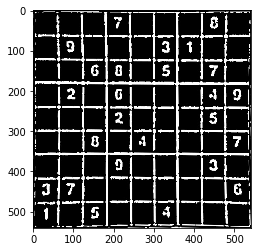

[[0. 0. 0. 7. 0. 0. 0. 8. 0.]
 [0. 0. 0. 0. 0. 3. 1. 0. 0.]
 [0. 0. 5. 0. 0. 5. 0. 7. 0.]
 [0. 2. 0. 6. 0. 0. 0. 4. 9.]
 [0. 0. 0. 2. 0. 0. 0. 5. 0.]
 [0. 0. 4. 0. 4. 0. 0. 0. 3.]
 [0. 0. 0. 4. 0. 0. 0. 2. 0.]
 [2. 1. 0. 0. 0. 0. 0. 0. 4.]
 [1. 0. 4. 0. 0. 7. 0. 0. 0.]] 



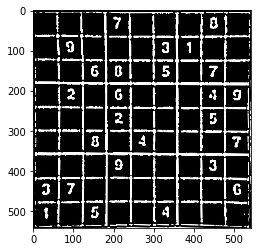

[[0. 0. 0. 7. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 3. 8. 0. 0.]
 [0. 0. 6. 0. 0. 5. 0. 8. 0.]
 [0. 2. 0. 6. 0. 0. 0. 4. 9.]
 [0. 0. 0. 2. 0. 0. 0. 5. 0.]
 [0. 0. 4. 0. 4. 0. 0. 0. 3.]
 [0. 0. 0. 4. 0. 0. 0. 2. 0.]
 [2. 1. 0. 0. 0. 0. 0. 0. 9.]
 [4. 0. 4. 0. 0. 4. 0. 0. 0.]] 



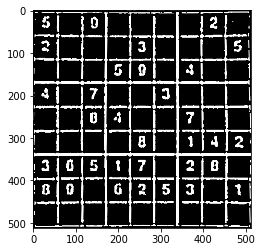

[[5. 0. 0. 0. 0. 0. 0. 2. 0.]
 [2. 0. 0. 0. 3. 0. 0. 0. 5.]
 [0. 0. 0. 5. 2. 0. 4. 0. 0.]
 [4. 0. 3. 0. 0. 2. 0. 0. 0.]
 [0. 0. 4. 4. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 4. 0. 1. 4. 2.]
 [2. 4. 5. 1. 3. 0. 2. 4. 0.]
 [4. 4. 0. 4. 2. 5. 2. 0. 3.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]] 



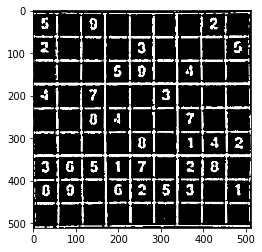

[[5. 0. 7. 5. 5. 5. 5. 2. 0.]
 [2. 0. 0. 5. 5. 5. 0. 0. 5.]
 [0. 0. 0. 5. 0. 0. 4. 0. 0.]
 [4. 0. 7. 0. 0. 3. 0. 0. 0.]
 [0. 0. 0. 4. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 4. 2.]
 [2. 6. 5. 1. 3. 0. 2. 4. 0.]
 [4. 2. 0. 5. 2. 5. 2. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]] 



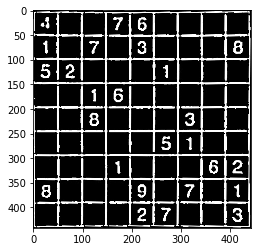

[[4. 0. 0. 7. 8. 0. 0. 0. 0.]
 [1. 0. 7. 0. 3. 0. 0. 0. 8.]
 [5. 2. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1. 5. 0. 0. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 3. 0. 0.]
 [0. 0. 0. 0. 0. 5. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 5. 2.]
 [8. 0. 0. 0. 9. 0. 2. 0. 1.]
 [0. 0. 0. 0. 2. 0. 0. 0. 3.]] 



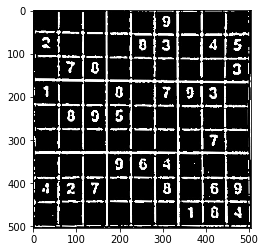

[[0. 0. 0. 0. 0. 9. 0. 0. 0.]
 [3. 0. 0. 0. 4. 2. 0. 4. 5.]
 [3. 3. 4. 0. 0. 0. 0. 0. 3.]
 [4. 0. 0. 4. 0. 3. 4. 3. 0.]
 [0. 4. 4. 4. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 9. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 6. 1. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 3. 4. 4.]] 



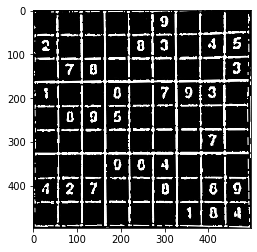

[[0. 0. 0. 0. 0. 4. 0. 0. 0.]
 [2. 0. 0. 0. 4. 3. 0. 4. 5.]
 [0. 3. 4. 0. 0. 0. 0. 0. 2.]
 [1. 0. 0. 4. 0. 4. 4. 4. 0.]
 [0. 4. 4. 4. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 4. 0.]
 [0. 0. 0. 4. 4. 4. 0. 0. 0.]
 [4. 4. 4. 0. 0. 4. 0. 4. 4.]
 [0. 0. 0. 0. 0. 0. 1. 4. 4.]] 



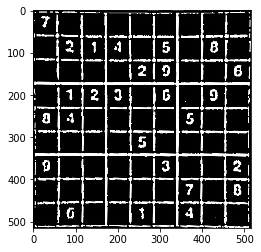

[[3. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 2. 9. 4. 0. 5. 0. 8. 0.]
 [0. 0. 0. 0. 2. 9. 0. 0. 8.]
 [0. 7. 2. 2. 0. 6. 0. 9. 0.]
 [3. 4. 0. 0. 0. 0. 5. 0. 0.]
 [0. 0. 0. 0. 5. 0. 0. 0. 0.]
 [4. 0. 0. 0. 0. 2. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 3. 0. 4.]
 [0. 4. 0. 0. 3. 0. 4. 0. 0.]] 



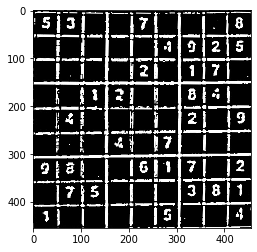

[[5. 2. 5. 0. 7. 0. 0. 0. 8.]
 [0. 0. 0. 0. 0. 4. 9. 2. 5.]
 [0. 0. 0. 0. 2. 0. 7. 3. 0.]
 [0. 0. 1. 2. 0. 0. 0. 5. 0.]
 [0. 4. 0. 0. 0. 0. 2. 0. 2.]
 [0. 0. 0. 4. 0. 7. 0. 0. 0.]
 [7. 8. 0. 0. 6. 1. 3. 0. 2.]
 [0. 7. 5. 0. 0. 0. 2. 2. 7.]
 [7. 0. 0. 0. 0. 5. 0. 0. 4.]] 



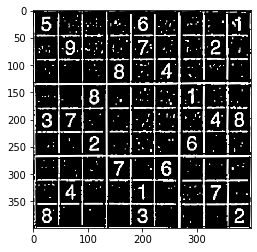

[[5. 0. 0. 0. 8. 0. 0. 0. 9.]
 [0. 9. 5. 0. 7. 0. 0. 2. 0.]
 [0. 0. 0. 8. 0. 4. 0. 0. 0.]
 [0. 0. 8. 0. 0. 0. 9. 0. 0.]
 [8. 7. 0. 0. 0. 0. 0. 4. 8.]
 [0. 0. 2. 0. 0. 0. 6. 0. 0.]
 [0. 0. 0. 7. 0. 8. 0. 0. 0.]
 [0. 4. 0. 0. 7. 0. 0. 7. 0.]
 [8. 0. 0. 0. 3. 0. 0. 0. 2.]] 



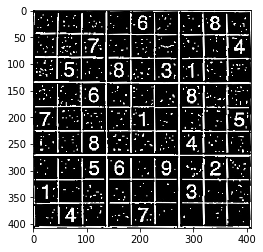

[[0. 0. 0. 0. 6. 0. 0. 8. 0.]
 [0. 2. 7. 0. 0. 4. 0. 0. 4.]
 [5. 5. 0. 8. 2. 3. 7. 0. 0.]
 [3. 0. 8. 0. 0. 0. 8. 0. 5.]
 [7. 0. 5. 0. 7. 0. 0. 0. 5.]
 [0. 0. 8. 0. 5. 0. 4. 0. 0.]
 [0. 0. 5. 6. 0. 9. 0. 2. 4.]
 [7. 0. 1. 0. 0. 0. 3. 0. 0.]
 [0. 4. 0. 0. 1. 0. 0. 0. 0.]] 



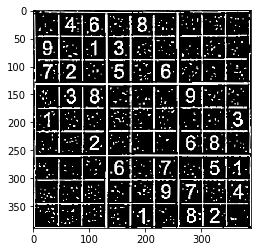

[[0. 2. 8. 5. 8. 0. 0. 5. 0.]
 [0. 4. 9. 3. 5. 0. 0. 3. 0.]
 [7. 2. 0. 5. 5. 8. 2. 0. 0.]
 [5. 8. 8. 5. 0. 0. 9. 0. 0.]
 [7. 5. 0. 3. 0. 0. 0. 0. 3.]
 [0. 0. 2. 0. 0. 0. 6. 8. 0.]
 [0. 0. 5. 6. 0. 7. 0. 5. 1.]
 [0. 0. 0. 0. 2. 9. 7. 5. 4.]
 [2. 5. 0. 5. 4. 0. 8. 2. 0.]] 



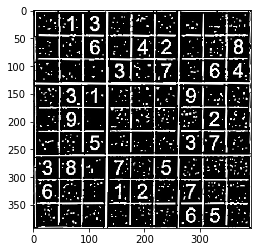

[[0. 9. 3. 0. 5. 0. 0. 0. 3.]
 [0. 0. 8. 0. 4. 2. 0. 5. 8.]
 [5. 3. 0. 3. 5. 7. 0. 6. 4.]
 [3. 3. 7. 0. 0. 0. 9. 0. 2.]
 [0. 8. 0. 5. 5. 7. 5. 2. 4.]
 [5. 5. 5. 0. 0. 0. 3. 7. 0.]
 [3. 8. 0. 7. 5. 5. 5. 5. 8.]
 [6. 5. 0. 7. 2. 0. 7. 5. 0.]
 [0. 0. 0. 0. 0. 0. 6. 5. 0.]] 



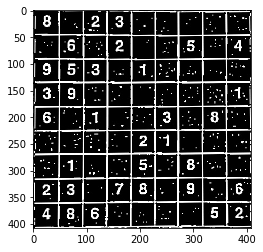

[[6. 0. 2. 3. 0. 0. 0. 0. 0.]
 [0. 5. 5. 2. 0. 0. 5. 0. 4.]
 [8. 5. 3. 0. 7. 3. 0. 0. 0.]
 [2. 8. 0. 0. 0. 0. 0. 2. 3.]
 [6. 0. 7. 0. 0. 3. 0. 4. 0.]
 [0. 0. 0. 0. 2. 7. 0. 0. 0.]
 [0. 7. 0. 0. 5. 0. 4. 0. 0.]
 [2. 3. 0. 3. 4. 0. 4. 0. 4.]
 [4. 4. 6. 0. 0. 0. 0. 9. 2.]] 



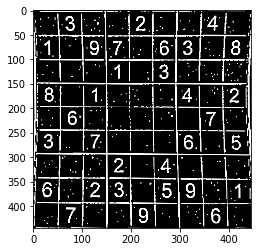

[[0. 3. 0. 0. 2. 0. 0. 4. 0.]
 [7. 0. 9. 7. 0. 8. 3. 0. 8.]
 [0. 0. 0. 9. 0. 3. 0. 4. 0.]
 [8. 7. 7. 0. 0. 0. 4. 7. 8.]
 [4. 6. 0. 0. 0. 0. 0. 0. 0.]
 [6. 0. 1. 0. 0. 0. 9. 0. 5.]
 [0. 0. 0. 2. 0. 4. 0. 0. 0.]
 [6. 0. 2. 0. 0. 5. 8. 0. 1.]
 [0. 7. 0. 0. 8. 0. 0. 6. 0.]] 



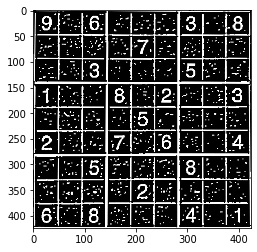

[[8. 2. 5. 0. 5. 5. 3. 0. 8.]
 [0. 7. 5. 5. 7. 0. 5. 0. 3.]
 [5. 0. 3. 0. 0. 0. 5. 3. 5.]
 [7. 3. 0. 8. 0. 2. 0. 5. 3.]
 [0. 5. 5. 0. 5. 0. 0. 0. 0.]
 [2. 0. 4. 7. 4. 6. 0. 0. 4.]
 [3. 0. 5. 5. 5. 3. 8. 0. 0.]
 [2. 2. 2. 5. 2. 5. 2. 0. 0.]
 [6. 5. 8. 2. 1. 0. 4. 0. 1.]] 



In [4]:
from pathlib import Path

warped_images = []
original_images = []
masked_images = []

f = open("Files/output.txt","w+")

for i in range (1, 1000):
    
    image_name = "image" + str(i) + ".jpg"
    image_path = "Output/" + image_name
    my_file = Path(image_path)
    
    if my_file.exists():

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        plt.imshow(image, 'gray')
        plt.show()
        
        resized_pixal = 800
        scale_percent = resized_pixal*200/(image.shape[1] + image.shape[0])
        width = int(image.shape[1] * scale_percent / 100)
        height = int(image.shape[0] * scale_percent / 100)
        dim = (width, height)
        image = cv2.resize(image, dim, interpolation = cv2.INTER_NEAREST)
        
        thresh, im_bw = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        image = cv2.threshold(image, thresh, 255, cv2.THRESH_BINARY)[1]
        
        res = extract_number(image)
        print(res, "\n")
        
        f.write(str(res) + "\n")
        
f.close()

#### Part 2 Complete

<hr>

## Part 3
In this part we wil work applying backtracking algorithm to solve the given sudokus

In [1]:
def findNextCellToFill(grid, i, j):
    for x in range(i,9):
        for y in range(j,9):
            if grid[x][y] == 0:
                return x,y
    for x in range(0,9):
        for y in range(0,9):
            if grid[x][y] == 0:
                return x,y
    return -1,-1

def isValid(grid, i, j, e):
    rowOk = all([e != grid[i][x] for x in range(9)])
    if rowOk:
        columnOk = all([e != grid[x][j] for x in range(9)])
        if columnOk:
            # finding the top left x,y co-ordinates of the section containing the i,j cell
            secTopX, secTopY = 3 *(i//3), 3 *(j//3) #floored quotient should be used here. 
            for x in range(secTopX, secTopX + 3):
                for y in range(secTopY, secTopY + 3):
                    if grid[x][y] == e:
                        return False
                    return True
    return False

def solveSudoku(grid, i=0, j=0):
    i, j = findNextCellToFill(grid, i, j)
    if i == -1:
        return True
    for e in range(1,10):
        if isValid(grid,i,j,e):
            grid[i][j] = e
            if solveSudoku(grid, i, j):
                return True
            # Undo the current cell for backtracking
            grid[i][j] = 0
    return False

In [2]:
import numpy as np

sudokus = []
sudoku = None

# Scan all the grids from Dataset and store them in list
# Since the output.txt didn't have accurate results, we used a different dataset for applying backtracking algorithm
with open("Files/dataset.txt", 'r') as file:
    
    # Iterate over every line
    for line in file:
        
        # Remove the last "\n" character from each line
        line = line.replace("\n", '')
        
        # Check if lien starts with "Grid" i.e check if the previous grid has been completed
        if line.startswith("Grid"):
            # Check if sudoku is not empty, if not then append it in list
            if sudoku is not None:
                sudoku = np.array(sudoku)
                sudokus.append(sudoku)
            # Since a new grid has started and we have appended earlier grid, we make sudoku empty list again
            sudoku = []
            
        else:
            # Since this is a new row, make "row" empty list
            row = []
            #Iterate over each digit in row
            for digit in line:
                row.append(int(digit))
            # Since we have completed this row, we append it to current sudoku
            sudoku.append(row)
            

# Print the final grid            
for sudoku in sudokus:
    for row in sudoku:
        print(row)
    print()

[0 0 3 0 2 0 6 0 0]
[9 0 0 3 0 5 0 0 1]
[0 0 1 8 0 6 4 0 0]
[0 0 8 1 0 2 9 0 0]
[7 0 0 0 0 0 0 0 8]
[0 0 6 7 0 8 2 0 0]
[0 0 2 6 0 9 5 0 0]
[8 0 0 2 0 3 0 0 9]
[0 0 5 0 1 0 3 0 0]

[2 0 0 0 8 0 3 0 0]
[0 6 0 0 7 0 0 8 4]
[0 3 0 5 0 0 2 0 9]
[0 0 0 1 0 5 4 0 8]
[0 0 0 0 0 0 0 0 0]
[4 0 2 7 0 6 0 0 0]
[3 0 1 0 0 7 0 4 0]
[7 2 0 0 4 0 0 6 0]
[0 0 4 0 1 0 0 0 3]

[0 0 0 0 0 0 9 0 7]
[0 0 0 4 2 0 1 8 0]
[0 0 0 7 0 5 0 2 6]
[1 0 0 9 0 4 0 0 0]
[0 5 0 0 0 0 0 4 0]
[0 0 0 5 0 7 0 0 9]
[9 2 0 1 0 8 0 0 0]
[0 3 4 0 5 9 0 0 0]
[5 0 7 0 0 0 0 0 0]

[0 3 0 0 5 0 0 4 0]
[0 0 8 0 1 0 5 0 0]
[4 6 0 0 0 0 0 1 2]
[0 7 0 5 0 2 0 8 0]
[0 0 0 6 0 3 0 0 0]
[0 4 0 1 0 9 0 3 0]
[2 5 0 0 0 0 0 9 8]
[0 0 1 0 2 0 6 0 0]
[0 8 0 0 6 0 0 2 0]

[0 2 0 8 1 0 7 4 0]
[7 0 0 0 0 3 1 0 0]
[0 9 0 0 0 2 8 0 5]
[0 0 9 0 4 0 0 8 7]
[4 0 0 2 0 8 0 0 3]
[1 6 0 0 3 0 2 0 0]
[3 0 2 7 0 0 0 6 0]
[0 0 5 6 0 0 0 0 8]
[0 7 6 0 5 1 0 9 0]

[1 0 0 9 2 0 0 0 0]
[5 2 4 0 1 0 0 0 0]
[0 0 0 0 0 0 0 7 0]
[0 5 0 0 0 8 1 0 2]
[0 0 0 0 0 0 0 

In [36]:
for sudoku in sudokus:

    if solveSudoku(sudoku):
        print('Given sudoku has been solved successfully')
        for row in sudoku:
            print(row)
        print()
    else:
        print('Sudoku cannot be solved')

Given sudoku has been solved successfully
[4, 5, 3, 9, 2, 1, 6, 8, 7]
[9, 6, 7, 3, 4, 5, 8, 2, 1]
[5, 9, 1, 8, 3, 6, 4, 7, 2]
[6, 4, 8, 1, 7, 2, 9, 5, 3]
[7, 2, 9, 5, 6, 4, 1, 3, 8]
[1, 3, 6, 7, 9, 8, 2, 4, 5]
[3, 7, 2, 6, 8, 9, 5, 1, 4]
[8, 1, 4, 2, 5, 3, 7, 6, 9]
[2, 8, 5, 4, 1, 7, 3, 9, 6]

Given sudoku has been solved successfully
[2, 4, 5, 9, 8, 1, 3, 7, 6]
[1, 6, 9, 2, 7, 3, 5, 8, 4]
[8, 3, 7, 5, 6, 4, 2, 1, 9]
[9, 7, 6, 1, 3, 5, 4, 2, 8]
[6, 1, 3, 4, 2, 8, 9, 5, 7]
[4, 5, 2, 7, 9, 6, 8, 3, 1]
[3, 9, 1, 8, 5, 7, 6, 4, 2]
[7, 2, 8, 3, 4, 9, 1, 6, 5]
[5, 8, 4, 6, 1, 2, 7, 9, 3]

Given sudoku has been solved successfully
[2, 1, 3, 8, 4, 6, 9, 5, 7]
[7, 9, 6, 4, 2, 3, 1, 8, 5]
[4, 8, 1, 7, 9, 5, 3, 2, 6]
[1, 7, 8, 9, 6, 4, 5, 3, 2]
[8, 5, 9, 6, 7, 1, 2, 4, 3]
[3, 4, 2, 5, 1, 7, 8, 6, 9]
[9, 2, 5, 1, 3, 8, 6, 7, 4]
[6, 3, 4, 2, 5, 9, 7, 1, 8]
[5, 6, 7, 3, 8, 2, 4, 9, 1]

Given sudoku has been solved successfully
[1, 3, 6, 2, 5, 7, 8, 4, 9]
[7, 2, 8, 9, 1, 4, 5, 6, 3]
[4, 6, 3, 8, 7, 5

Given sudoku has been solved successfully
[2, 4, 8, 1, 7, 5, 6, 9, 3]
[6, 5, 7, 3, 9, 8, 1, 2, 4]
[1, 3, 4, 2, 8, 6, 5, 7, 9]
[8, 6, 1, 9, 4, 2, 7, 3, 5]
[5, 7, 3, 8, 2, 1, 9, 4, 6]
[7, 2, 9, 6, 5, 4, 3, 8, 1]
[3, 1, 2, 4, 6, 9, 8, 5, 7]
[4, 9, 5, 7, 1, 3, 2, 6, 8]
[9, 8, 6, 5, 3, 7, 4, 1, 2]

Given sudoku has been solved successfully
[1, 2, 6, 3, 4, 5, 7, 8, 9]
[8, 3, 9, 7, 5, 1, 6, 4, 2]
[6, 4, 7, 1, 2, 9, 5, 3, 8]
[3, 7, 4, 2, 1, 8, 9, 6, 5]
[2, 9, 1, 5, 3, 6, 8, 7, 4]
[7, 6, 5, 9, 8, 4, 3, 2, 1]
[9, 1, 8, 4, 6, 7, 2, 5, 3]
[4, 5, 3, 8, 7, 2, 1, 9, 6]
[5, 8, 2, 6, 9, 3, 4, 1, 7]

Given sudoku has been solved successfully
[1, 2, 3, 4, 6, 7, 9, 8, 5]
[7, 5, 6, 2, 1, 8, 3, 4, 9]
[9, 6, 4, 7, 8, 5, 1, 2, 3]
[5, 3, 7, 8, 9, 2, 4, 1, 6]
[2, 7, 8, 1, 3, 9, 5, 6, 4]
[8, 9, 1, 5, 4, 6, 2, 3, 7]
[6, 4, 9, 3, 7, 1, 8, 5, 2]
[3, 1, 2, 9, 5, 4, 6, 7, 8]
[4, 8, 5, 6, 2, 3, 7, 9, 1]

Given sudoku has been solved successfully
[6, 3, 8, 1, 7, 9, 5, 4, 2]
[2, 5, 1, 6, 3, 8, 9, 7, 4]
[1, 9, 2, 4, 8, 5

### Part 3 Complete